In [1]:
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from sklearn.preprocessing import StandardScaler
import sklearn

from sklearn.linear_model import  LogisticRegression
from sklearn.model_selection import cross_val_score, KFold, GridSearchCV
from sklearn.metrics import f1_score, accuracy_score

from sklearn.metrics import classification_report

In [15]:
df = pd.read_csv('diabetes_012_health_indicators_BRFSS2021.csv')
df2 = pd.read_csv('diabetes_012_health_indicators_BRFSS2021.csv')

In [3]:
df.head()

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,0,1.0,1,15.0,1.0,0.0,0.0,0,1,...,1,0.0,5.0,10.0,20.0,0.0,0,11,4.0,5.0
1,2.0,1,0.0,1,28.0,0.0,0.0,1.0,0,1,...,1,0.0,2.0,0.0,0.0,0.0,0,11,4.0,3.0
2,2.0,1,1.0,1,33.0,0.0,0.0,0.0,1,1,...,1,0.0,2.0,10.0,0.0,0.0,0,9,4.0,7.0
3,2.0,0,1.0,1,29.0,0.0,1.0,1.0,1,1,...,1,0.0,5.0,0.0,30.0,1.0,1,12,3.0,4.0
4,0.0,0,0.0,1,24.0,1.0,0.0,0.0,0,0,...,1,0.0,3.0,0.0,0.0,1.0,1,13,5.0,6.0


In [4]:
df.columns

Index(['Diabetes_012', 'HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker',
       'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education',
       'Income'],
      dtype='object')

In [5]:
print(df['Diabetes_012'].value_counts())

0.0    197191
2.0     33568
1.0      5619
Name: Diabetes_012, dtype: int64


In [6]:
df.describe()

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
count,236378.000000,236378.000000,236378.000000,236378.000000,236378.000000,236378.000000,236378.000000,236378.000000,236378.000000,236378.000000,...,236378.000000,236378.000000,236378.000000,236378.000000,236378.000000,236378.000000,236378.000000,236378.000000,236378.000000,236378.000000
mean,0.307791,0.418558,0.402059,0.963347,28.953579,0.411997,0.038900,0.086548,0.779231,0.621259,...,0.962573,0.063737,2.480717,3.937710,3.751297,0.153948,0.477824,7.863930,5.139099,6.927451
std,0.705037,0.493324,0.490315,0.187909,6.552055,0.492196,0.193356,0.281172,0.414766,0.485074,...,0.189807,0.244284,1.029134,7.886506,8.245907,0.360900,0.499509,3.236997,0.946185,2.375450
min,0.000000,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,1.000000,24.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,5.000000,4.000000,5.000000
50%,0.000000,0.000000,0.000000,1.000000,28.000000,0.000000,0.000000,0.000000,1.000000,1.000000,...,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,8.000000,5.000000,7.000000
75%,0.000000,1.000000,1.000000,1.000000,32.000000,1.000000,0.000000,0.000000,1.000000,1.000000,...,1.000000,0.000000,3.000000,4.000000,2.000000,0.000000,1.000000,10.000000,6.000000,9.000000
max,2.000000,1.000000,1.000000,1.000000,99.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,5.000000,30.000000,30.000000,1.000000,1.000000,13.000000,6.000000,11.000000


In [3]:
df.shape

(236378, 22)

# EDA

In [7]:
df_diabetes0 = df[df['Diabetes_012'] == 0]
df_diabetes1 = df[df['Diabetes_012'] == 1]
df_diabetes2 = df[df['Diabetes_012'] == 2]

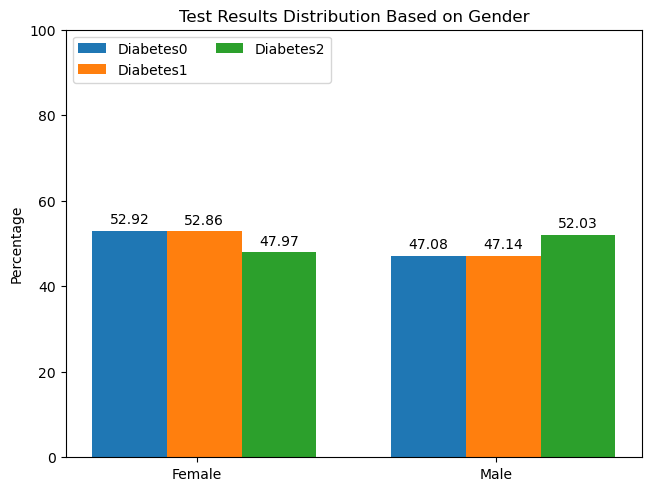

In [8]:
count_df_diabetes0 = df_diabetes0.groupby('Sex').size()
count_df_diabetes1 = df_diabetes1.groupby('Sex').size()
count_df_diabetes2 = df_diabetes2.groupby('Sex').size()

gender_M_diabetes0 = round(count_df_diabetes0[1]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)
gender_F_diabetes0 = round(count_df_diabetes0[0]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)

gender_M_diabetes1 = round(count_df_diabetes1[1]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)
gender_F_diabetes1 = round(count_df_diabetes1[0]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)

gender_M_diabetes2 = round(count_df_diabetes2[1]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)
gender_F_diabetes2 = round(count_df_diabetes2[0]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)


gender = ("Female", "Male")
counts = {
    'Diabetes0': (gender_F_diabetes0, gender_M_diabetes0),
    'Diabetes1' : (gender_F_diabetes1, gender_M_diabetes1),
    'Diabetes2' : (gender_F_diabetes2, gender_M_diabetes2),
}
x = np.arange(len(gender))
width = 0.25
multiplier = 0
fig, ax = plt.subplots(layout = 'constrained')

for attribute, measurement in counts.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label = attribute)
    ax.bar_label(rects, padding = 3)
    multiplier += 1

ax.set_ylabel('Percentage')
ax.set_title('Test Results Distribution Based on Gender')
ax.set_xticks(x + width/2+0.1, gender)
ax.legend(loc = 'upper left', ncols = 2)
ax.set_ylim(0, 100)

plt.show()

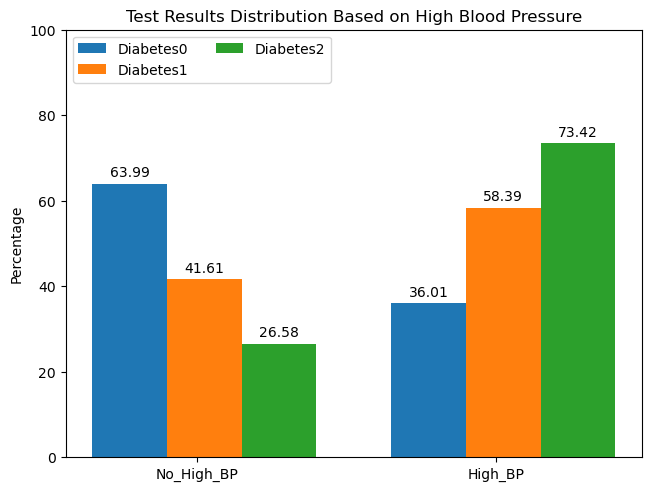

In [9]:
count_df_diabetes0 = df_diabetes0.groupby('HighBP').size()
count_df_diabetes1 = df_diabetes1.groupby('HighBP').size()
count_df_diabetes2 = df_diabetes2.groupby('HighBP').size()

highBP_0_diabetes0 = round(count_df_diabetes0[0]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)
highBP_1_diabetes0 = round(count_df_diabetes0[1]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)

highBP_0_diabetes1 = round(count_df_diabetes1[0]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)
highBP_1_diabetes1 = round(count_df_diabetes1[1]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)

highBP_0_diabetes2 = round(count_df_diabetes2[0]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)
highBP_1_diabetes2 = round(count_df_diabetes2[1]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)


bp = ("No_High_BP", "High_BP")
counts = {
    'Diabetes0': (highBP_0_diabetes0, highBP_1_diabetes0),
    'Diabetes1' : (highBP_0_diabetes1, highBP_1_diabetes1),
    'Diabetes2' : (highBP_0_diabetes2, highBP_1_diabetes2),
}
x = np.arange(len(bp))
width = 0.25
multiplier = 0
fig, ax = plt.subplots(layout = 'constrained')

for attribute, measurement in counts.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label = attribute)
    ax.bar_label(rects, padding = 3)
    multiplier += 1

ax.set_ylabel('Percentage')
ax.set_title('Test Results Distribution Based on High Blood Pressure')
ax.set_xticks(x + width/2+0.1, bp)
ax.legend(loc = 'upper left', ncols = 2)
ax.set_ylim(0, 100)

plt.show()

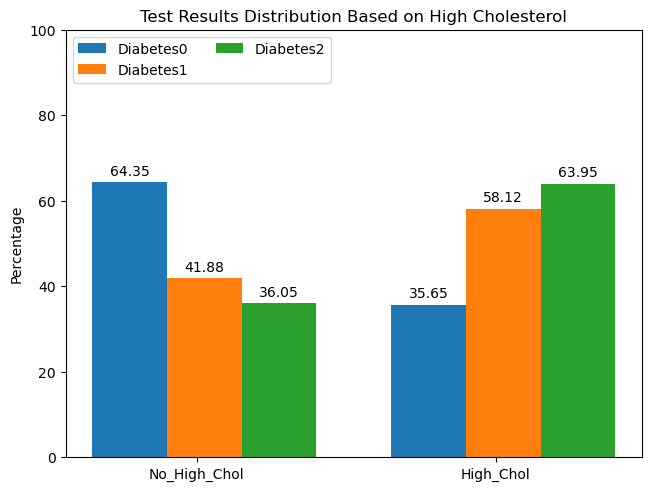

In [10]:
count_df_diabetes0 = df_diabetes0.groupby('HighChol').size()
count_df_diabetes1 = df_diabetes1.groupby('HighChol').size()
count_df_diabetes2 = df_diabetes2.groupby('HighChol').size()

highChol_0_diabetes0 = round(count_df_diabetes0[0]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)
highChol_1_diabetes0 = round(count_df_diabetes0[1]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)

highChol_0_diabetes1 = round(count_df_diabetes1[0]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)
highChol_1_diabetes1 = round(count_df_diabetes1[1]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)

highChol_0_diabetes2 = round(count_df_diabetes2[0]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)
highChol_1_diabetes2 = round(count_df_diabetes2[1]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)


chol = ("No_High_Chol", "High_Chol")
counts = {
    'Diabetes0': (highChol_0_diabetes0, highChol_1_diabetes0),
    'Diabetes1' : (highChol_0_diabetes1, highChol_1_diabetes1),
    'Diabetes2' : (highChol_0_diabetes2, highChol_1_diabetes2),
}
x = np.arange(len(chol))
width = 0.25
multiplier = 0
fig, ax = plt.subplots(layout = 'constrained')

for attribute, measurement in counts.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label = attribute)
    ax.bar_label(rects, padding = 3)
    multiplier += 1

ax.set_ylabel('Percentage')
ax.set_title('Test Results Distribution Based on High Cholesterol')
ax.set_xticks(x + width/2+0.1, chol)
ax.legend(loc = 'upper left', ncols = 2)
ax.set_ylim(0, 100)

plt.show()

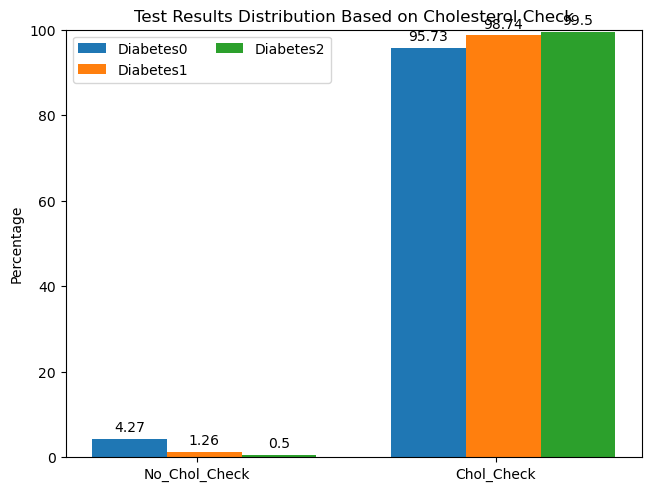

In [11]:
count_df_diabetes0 = df_diabetes0.groupby('CholCheck').size()
count_df_diabetes1 = df_diabetes1.groupby('CholCheck').size()
count_df_diabetes2 = df_diabetes2.groupby('CholCheck').size()

cholCheck_0_diabetes0 = round(count_df_diabetes0[0]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)
cholCheck_1_diabetes0 = round(count_df_diabetes0[1]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)

cholCheck_0_diabetes1 = round(count_df_diabetes1[0]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)
cholCheck_1_diabetes1 = round(count_df_diabetes1[1]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)

cholCheck_0_diabetes2 = round(count_df_diabetes2[0]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)
cholCheck_1_diabetes2 = round(count_df_diabetes2[1]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)


chol_check = ("No_Chol_Check", "Chol_Check")
counts = {
    'Diabetes0': (cholCheck_0_diabetes0, cholCheck_1_diabetes0),
    'Diabetes1' : (cholCheck_0_diabetes1, cholCheck_1_diabetes1),
    'Diabetes2' : (cholCheck_0_diabetes2, cholCheck_1_diabetes2),
}
x = np.arange(len(chol_check))
width = 0.25
multiplier = 0
fig, ax = plt.subplots(layout = 'constrained')

for attribute, measurement in counts.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label = attribute)
    ax.bar_label(rects, padding = 3)
    multiplier += 1

ax.set_ylabel('Percentage')
ax.set_title('Test Results Distribution Based on Cholesterol Check')
ax.set_xticks(x + width/2+0.1, chol_check)
ax.legend(loc = 'upper left', ncols = 2)
ax.set_ylim(0, 100)

plt.show()

In [12]:
print(df['CholCheck'].value_counts())

1    227714
0      8664
Name: CholCheck, dtype: int64


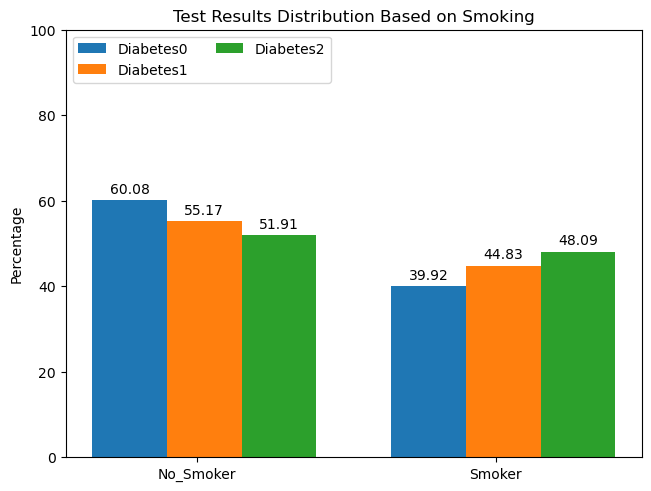

In [13]:
count_df_diabetes0 = df_diabetes0.groupby('Smoker').size()
count_df_diabetes1 = df_diabetes1.groupby('Smoker').size()
count_df_diabetes2 = df_diabetes2.groupby('Smoker').size()

smoker_0_diabetes0 = round(count_df_diabetes0[0]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)
smoker_1_diabetes0 = round(count_df_diabetes0[1]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)

smoker_0_diabetes1 = round(count_df_diabetes1[0]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)
smoker_1_diabetes1 = round(count_df_diabetes1[1]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)

smoker_0_diabetes2 = round(count_df_diabetes2[0]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)
smoker_1_diabetes2 = round(count_df_diabetes2[1]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)


smoker = ("No_Smoker", "Smoker")
counts = {
    'Diabetes0': (smoker_0_diabetes0, smoker_1_diabetes0),
    'Diabetes1' : (smoker_0_diabetes1, smoker_1_diabetes1),
    'Diabetes2' : (smoker_0_diabetes2, smoker_1_diabetes2),
}
x = np.arange(len(smoker))
width = 0.25
multiplier = 0
fig, ax = plt.subplots(layout = 'constrained')

for attribute, measurement in counts.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label = attribute)
    ax.bar_label(rects, padding = 3)
    multiplier += 1

ax.set_ylabel('Percentage')
ax.set_title('Test Results Distribution Based on Smoking')
ax.set_xticks(x + width/2+0.1, smoker)
ax.legend(loc = 'upper left', ncols = 2)
ax.set_ylim(0, 100)

plt.show()

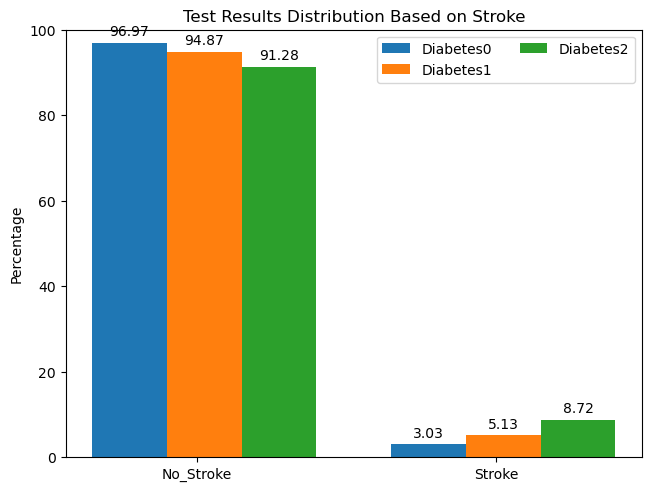

In [14]:
count_df_diabetes0 = df_diabetes0.groupby('Stroke').size()
count_df_diabetes1 = df_diabetes1.groupby('Stroke').size()
count_df_diabetes2 = df_diabetes2.groupby('Stroke').size()

stroke_0_diabetes0 = round(count_df_diabetes0[0]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)
stroke_1_diabetes0 = round(count_df_diabetes0[1]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)

stroke_0_diabetes1 = round(count_df_diabetes1[0]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)
stroke_1_diabetes1 = round(count_df_diabetes1[1]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)

stroke_0_diabetes2 = round(count_df_diabetes2[0]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)
stroke_1_diabetes2 = round(count_df_diabetes2[1]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)


stroke = ("No_Stroke", "Stroke")
counts = {
    'Diabetes0': (stroke_0_diabetes0, stroke_1_diabetes0),
    'Diabetes1' : (stroke_0_diabetes1, stroke_1_diabetes1),
    'Diabetes2' : (stroke_0_diabetes2, stroke_1_diabetes2),
}
x = np.arange(len(stroke))
width = 0.25
multiplier = 0
fig, ax = plt.subplots(layout = 'constrained')

for attribute, measurement in counts.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label = attribute)
    ax.bar_label(rects, padding = 3)
    multiplier += 1

ax.set_ylabel('Percentage')
ax.set_title('Test Results Distribution Based on Stroke')
ax.set_xticks(x + width/2+0.1, stroke)
ax.legend(loc = 'upper right', ncols = 2)
ax.set_ylim(0, 100)

plt.show()

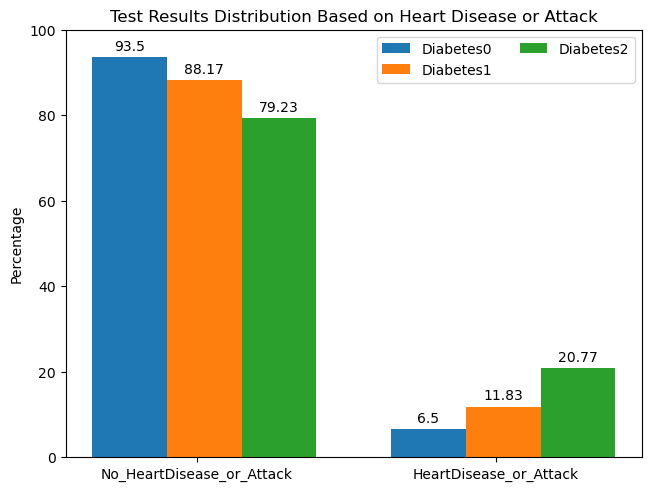

In [15]:
count_df_diabetes0 = df_diabetes0.groupby('HeartDiseaseorAttack').size()
count_df_diabetes1 = df_diabetes1.groupby('HeartDiseaseorAttack').size()
count_df_diabetes2 = df_diabetes2.groupby('HeartDiseaseorAttack').size()

hda_0_diabetes0 = round(count_df_diabetes0[0]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)
hda_1_diabetes0 = round(count_df_diabetes0[1]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)

hda_0_diabetes1 = round(count_df_diabetes1[0]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)
hda_1_diabetes1 = round(count_df_diabetes1[1]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)

hda_0_diabetes2 = round(count_df_diabetes2[0]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)
hda_1_diabetes2 = round(count_df_diabetes2[1]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)


hda = ("No_HeartDisease_or_Attack", "HeartDisease_or_Attack")
counts = {
    'Diabetes0': (hda_0_diabetes0, hda_1_diabetes0),
    'Diabetes1' : (hda_0_diabetes1, hda_1_diabetes1),
    'Diabetes2' : (hda_0_diabetes2, hda_1_diabetes2),
}
x = np.arange(len(hda))
width = 0.25
multiplier = 0
fig, ax = plt.subplots(layout = 'constrained')

for attribute, measurement in counts.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label = attribute)
    ax.bar_label(rects, padding = 3)
    multiplier += 1

ax.set_ylabel('Percentage')
ax.set_title('Test Results Distribution Based on Heart Disease or Attack')
ax.set_xticks(x + width/2+0.1, hda)
ax.legend(loc = 'upper right', ncols = 2)
ax.set_ylim(0, 100)

plt.show()

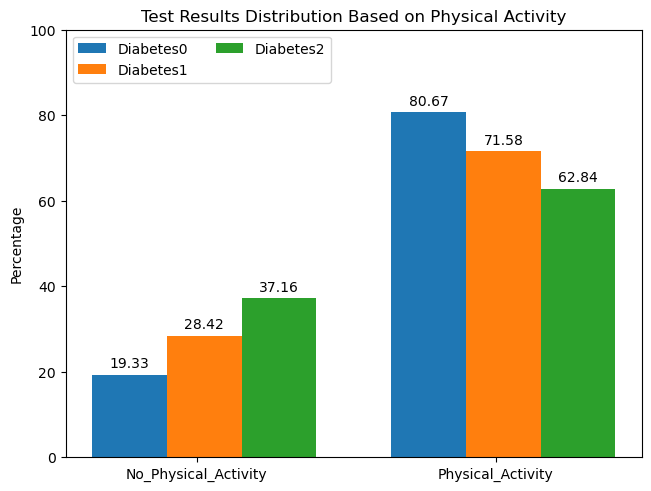

In [16]:
count_df_diabetes0 = df_diabetes0.groupby('PhysActivity').size()
count_df_diabetes1 = df_diabetes1.groupby('PhysActivity').size()
count_df_diabetes2 = df_diabetes2.groupby('PhysActivity').size()

physical_activity_0_diabetes0 = round(count_df_diabetes0[0]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)
physical_activity_1_diabetes0 = round(count_df_diabetes0[1]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)

physical_activity_0_diabetes1 = round(count_df_diabetes1[0]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)
physical_activity_1_diabetes1 = round(count_df_diabetes1[1]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)

physical_activity_0_diabetes2 = round(count_df_diabetes2[0]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)
physical_activity_1_diabetes2 = round(count_df_diabetes2[1]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)


physical_activity = ("No_Physical_Activity", "Physical_Activity")
counts = {
    'Diabetes0': (physical_activity_0_diabetes0, physical_activity_1_diabetes0),
    'Diabetes1' : (physical_activity_0_diabetes1, physical_activity_1_diabetes1),
    'Diabetes2' : (physical_activity_0_diabetes2, physical_activity_1_diabetes2),
}
x = np.arange(len(physical_activity))
width = 0.25
multiplier = 0
fig, ax = plt.subplots(layout = 'constrained')

for attribute, measurement in counts.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label = attribute)
    ax.bar_label(rects, padding = 3)
    multiplier += 1

ax.set_ylabel('Percentage')
ax.set_title('Test Results Distribution Based on Physical Activity')
ax.set_xticks(x + width/2+0.1, physical_activity)
ax.legend(loc = 'upper left', ncols = 2)
ax.set_ylim(0, 100)

plt.show()

In [17]:
print(df['PhysActivity'].value_counts())

1    184193
0     52185
Name: PhysActivity, dtype: int64


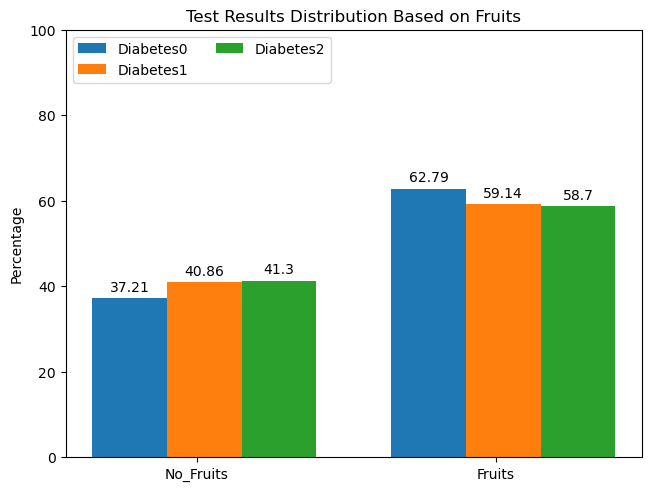

In [18]:
count_df_diabetes0 = df_diabetes0.groupby('Fruits').size()
count_df_diabetes1 = df_diabetes1.groupby('Fruits').size()
count_df_diabetes2 = df_diabetes2.groupby('Fruits').size()

fruits_0_diabetes0 = round(count_df_diabetes0[0]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)
fruits_1_diabetes0 = round(count_df_diabetes0[1]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)

fruits_0_diabetes1 = round(count_df_diabetes1[0]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)
fruits_1_diabetes1 = round(count_df_diabetes1[1]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)

fruits_0_diabetes2 = round(count_df_diabetes2[0]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)
fruits_1_diabetes2 = round(count_df_diabetes2[1]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)


fruits = ("No_Fruits", "Fruits")
counts = {
    'Diabetes0': (fruits_0_diabetes0, fruits_1_diabetes0),
    'Diabetes1' : (fruits_0_diabetes1, fruits_1_diabetes1),
    'Diabetes2' : (fruits_0_diabetes2, fruits_1_diabetes2),
}
x = np.arange(len(fruits))
width = 0.25
multiplier = 0
fig, ax = plt.subplots(layout = 'constrained')

for attribute, measurement in counts.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label = attribute)
    ax.bar_label(rects, padding = 3)
    multiplier += 1

ax.set_ylabel('Percentage')
ax.set_title('Test Results Distribution Based on Fruits')
ax.set_xticks(x + width/2+0.1, fruits)
ax.legend(loc = 'upper left', ncols = 2)
ax.set_ylim(0, 100)

plt.show()

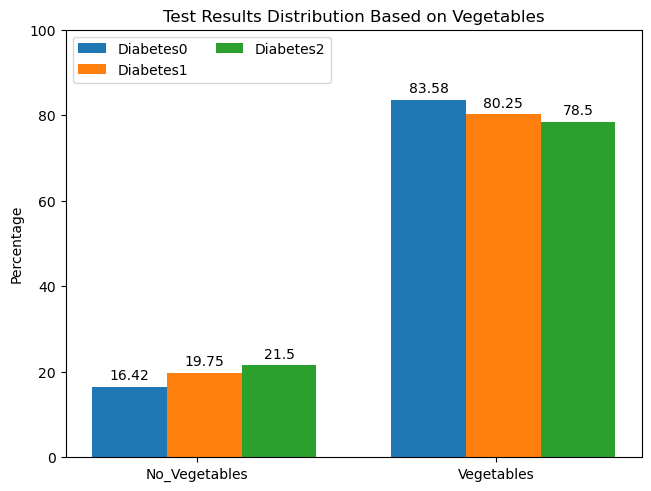

In [19]:
count_df_diabetes0 = df_diabetes0.groupby('Veggies').size()
count_df_diabetes1 = df_diabetes1.groupby('Veggies').size()
count_df_diabetes2 = df_diabetes2.groupby('Veggies').size()

veggies_0_diabetes0 = round(count_df_diabetes0[0]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)
veggies_1_diabetes0 = round(count_df_diabetes0[1]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)

veggies_0_diabetes1 = round(count_df_diabetes1[0]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)
veggies_1_diabetes1 = round(count_df_diabetes1[1]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)

veggies_0_diabetes2 = round(count_df_diabetes2[0]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)
veggies_1_diabetes2 = round(count_df_diabetes2[1]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)


veggies = ("No_Vegetables", "Vegetables")
counts = {
    'Diabetes0': (veggies_0_diabetes0, veggies_1_diabetes0),
    'Diabetes1' : (veggies_0_diabetes1, veggies_1_diabetes1),
    'Diabetes2' : (veggies_0_diabetes2, veggies_1_diabetes2),
}
x = np.arange(len(veggies))
width = 0.25
multiplier = 0
fig, ax = plt.subplots(layout = 'constrained')

for attribute, measurement in counts.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label = attribute)
    ax.bar_label(rects, padding = 3)
    multiplier += 1

ax.set_ylabel('Percentage')
ax.set_title('Test Results Distribution Based on Vegetables')
ax.set_xticks(x + width/2+0.1, veggies)
ax.legend(loc = 'upper left', ncols = 2)
ax.set_ylim(0, 100)

plt.show()

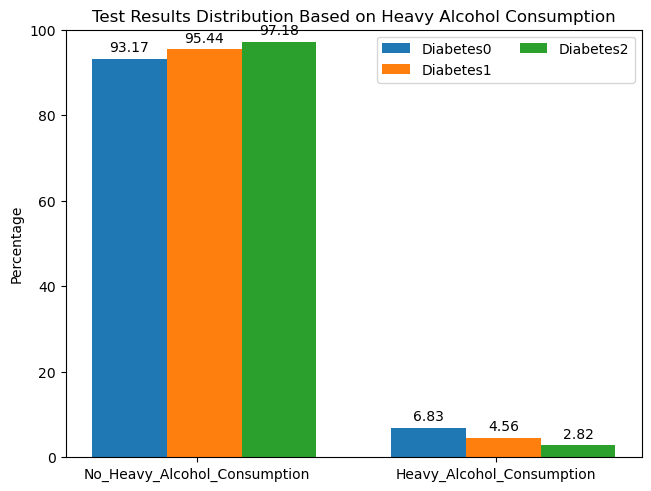

In [20]:
count_df_diabetes0 = df_diabetes0.groupby('HvyAlcoholConsump').size()
count_df_diabetes1 = df_diabetes1.groupby('HvyAlcoholConsump').size()
count_df_diabetes2 = df_diabetes2.groupby('HvyAlcoholConsump').size()

hvyalccons_0_diabetes0 = round(count_df_diabetes0[0]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)
hvyalccons_1_diabetes0 = round(count_df_diabetes0[1]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)

hvyalccons_0_diabetes1 = round(count_df_diabetes1[0]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)
hvyalccons_1_diabetes1 = round(count_df_diabetes1[1]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)

hvyalccons_0_diabetes2 = round(count_df_diabetes2[0]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)
hvyalccons_1_diabetes2 = round(count_df_diabetes2[1]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)


hvyalccons = ("No_Heavy_Alcohol_Consumption", "Heavy_Alcohol_Consumption")
counts = {
    'Diabetes0': (hvyalccons_0_diabetes0, hvyalccons_1_diabetes0),
    'Diabetes1' : (hvyalccons_0_diabetes1, hvyalccons_1_diabetes1),
    'Diabetes2' : (hvyalccons_0_diabetes2, hvyalccons_1_diabetes2),
}
x = np.arange(len(hvyalccons))
width = 0.25
multiplier = 0
fig, ax = plt.subplots(layout = 'constrained')

for attribute, measurement in counts.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label = attribute)
    ax.bar_label(rects, padding = 3)
    multiplier += 1

ax.set_ylabel('Percentage')
ax.set_title('Test Results Distribution Based on Heavy Alcohol Consumption')
ax.set_xticks(x + width/2+0.1, hvyalccons)
ax.legend(loc = 'upper right', ncols = 2)
ax.set_ylim(0, 100)

plt.show()

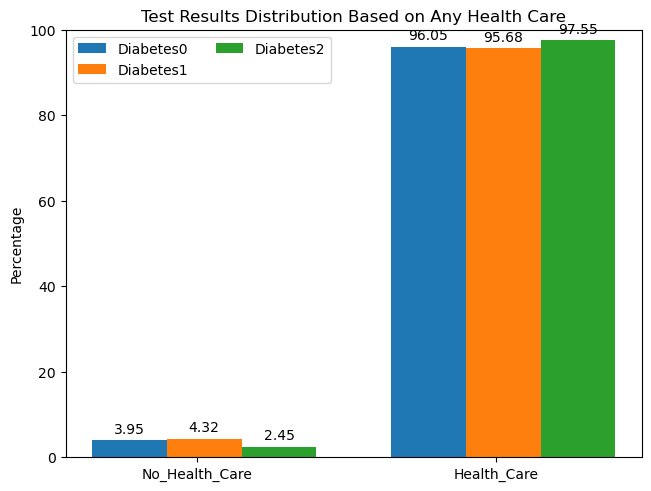

In [21]:
count_df_diabetes0 = df_diabetes0.groupby('AnyHealthcare').size()
count_df_diabetes1 = df_diabetes1.groupby('AnyHealthcare').size()
count_df_diabetes2 = df_diabetes2.groupby('AnyHealthcare').size()

anyhlthcare_0_diabetes0 = round(count_df_diabetes0[0]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)
anyhlthcare_1_diabetes0 = round(count_df_diabetes0[1]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)

anyhlthcare_0_diabetes1 = round(count_df_diabetes1[0]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)
anyhlthcare_1_diabetes1 = round(count_df_diabetes1[1]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)

anyhlthcare_0_diabetes2 = round(count_df_diabetes2[0]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)
anyhlthcare_1_diabetes2 = round(count_df_diabetes2[1]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)


anyhlthcare = ("No_Health_Care", "Health_Care")
counts = {
    'Diabetes0': (anyhlthcare_0_diabetes0, anyhlthcare_1_diabetes0),
    'Diabetes1' : (anyhlthcare_0_diabetes1, anyhlthcare_1_diabetes1),
    'Diabetes2' : (anyhlthcare_0_diabetes2, anyhlthcare_1_diabetes2),
}
x = np.arange(len(anyhlthcare))
width = 0.25
multiplier = 0
fig, ax = plt.subplots(layout = 'constrained')

for attribute, measurement in counts.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label = attribute)
    ax.bar_label(rects, padding = 3)
    multiplier += 1

ax.set_ylabel('Percentage')
ax.set_title('Test Results Distribution Based on Any Health Care')
ax.set_xticks(x + width/2+0.1, anyhlthcare)
ax.legend(loc = 'upper left', ncols = 2)
ax.set_ylim(0, 100)

plt.show()

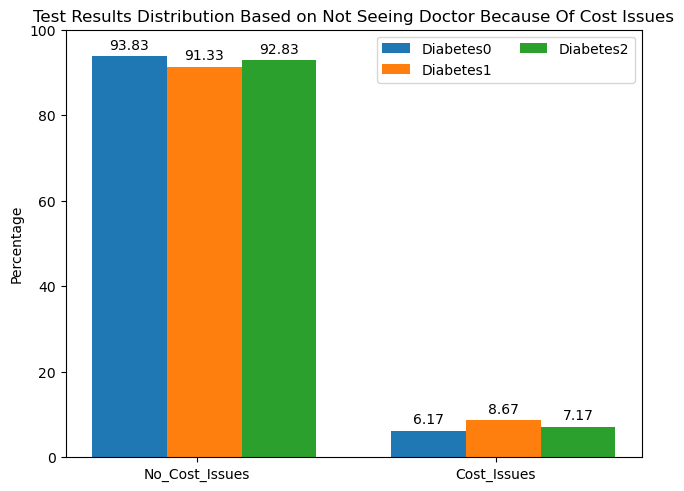

In [22]:
count_df_diabetes0 = df_diabetes0.groupby('NoDocbcCost').size()
count_df_diabetes1 = df_diabetes1.groupby('NoDocbcCost').size()
count_df_diabetes2 = df_diabetes2.groupby('NoDocbcCost').size()

doccost_0_diabetes0 = round(count_df_diabetes0[0]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)
doccost_1_diabetes0 = round(count_df_diabetes0[1]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)

doccost_0_diabetes1 = round(count_df_diabetes1[0]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)
doccost_1_diabetes1 = round(count_df_diabetes1[1]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)

doccost_0_diabetes2 = round(count_df_diabetes2[0]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)
doccost_1_diabetes2 = round(count_df_diabetes2[1]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)


doccost = ("No_Cost_Issues", "Cost_Issues")
counts = {
    'Diabetes0': (doccost_0_diabetes0, doccost_1_diabetes0),
    'Diabetes1' : (doccost_0_diabetes1, doccost_1_diabetes1),
    'Diabetes2' : (doccost_0_diabetes2, doccost_1_diabetes2),
}
x = np.arange(len(doccost))
width = 0.25
multiplier = 0
fig, ax = plt.subplots(layout = 'constrained')

for attribute, measurement in counts.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label = attribute)
    ax.bar_label(rects, padding = 3)
    multiplier += 1

ax.set_ylabel('Percentage')
ax.set_title('Test Results Distribution Based on Not Seeing Doctor Because Of Cost Issues')
ax.set_xticks(x + width/2+0.1, doccost)
ax.legend(loc = 'upper right', ncols = 2)
ax.set_ylim(0, 100)

plt.show()

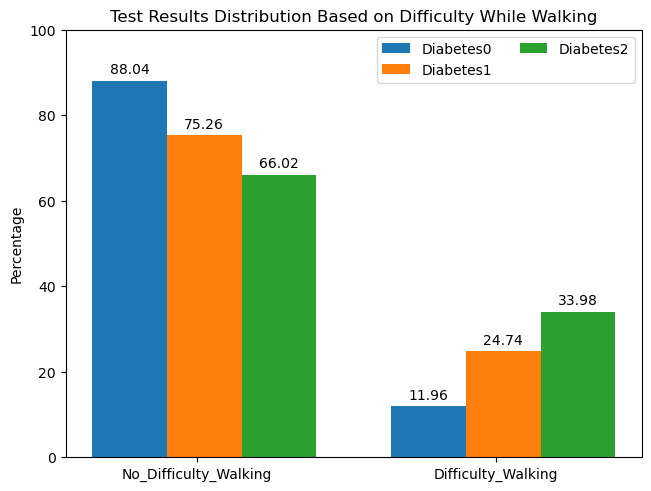

In [23]:
count_df_diabetes0 = df_diabetes0.groupby('DiffWalk').size()
count_df_diabetes1 = df_diabetes1.groupby('DiffWalk').size()
count_df_diabetes2 = df_diabetes2.groupby('DiffWalk').size()

diffwalk_0_diabetes0 = round(count_df_diabetes0[0]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)
diffwalk_1_diabetes0 = round(count_df_diabetes0[1]/(count_df_diabetes0[0] + count_df_diabetes0[1]) * 100, 2)

diffwalk_0_diabetes1 = round(count_df_diabetes1[0]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)
diffwalk_1_diabetes1 = round(count_df_diabetes1[1]/(count_df_diabetes1[0] + count_df_diabetes1[1]) * 100, 2)

diffwalk_0_diabetes2 = round(count_df_diabetes2[0]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)
diffwalk_1_diabetes2 = round(count_df_diabetes2[1]/(count_df_diabetes2[0] + count_df_diabetes2[1]) * 100, 2)


diffwalk = ("No_Difficulty_Walking", "Difficulty_Walking")
counts = {
    'Diabetes0': (diffwalk_0_diabetes0, diffwalk_1_diabetes0),
    'Diabetes1' : (diffwalk_0_diabetes1, diffwalk_1_diabetes1),
    'Diabetes2' : (diffwalk_0_diabetes2, diffwalk_1_diabetes2),
}
x = np.arange(len(diffwalk))
width = 0.25
multiplier = 0
fig, ax = plt.subplots(layout = 'constrained')

for attribute, measurement in counts.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label = attribute)
    ax.bar_label(rects, padding = 3)
    multiplier += 1

ax.set_ylabel('Percentage')
ax.set_title('Test Results Distribution Based on Difficulty While Walking')
ax.set_xticks(x + width/2+0.1, diffwalk)
ax.legend(loc = 'upper right', ncols = 2)
ax.set_ylim(0, 100)

plt.show()

# Data transformation

In [3]:
mapping_dict = {1: 'Never attended high school or kindergarden', 
                2: 'Elementary', 
                3: 'Some high school',
                4: 'High school graduate', 
                5: 'Some college or technical school',
                6: 'College graduate'}

df['Education'] = df['Education'].replace(mapping_dict)

In [4]:
df['Education'] = df['Education'].replace(['Never attended high school or kindergarden', 
                                           'Elementary', 
                                           'Some high school'], 
                                           'Other')

In [5]:
print(df.Education.value_counts())

College graduate                    108402
Some college or technical school     65377
High school graduate                 52741
Other                                 9858
Name: Education, dtype: int64


In [6]:
mapping_dict = {1: 'Never attended high school or kindergarden', 
                2: 'Elementary', 
                3: 'Some high school',
                4: 'High school graduate', 
                5: 'Some college or technical school',
                6: 'College graduate'}

df2['Education'] = df2['Education'].replace(mapping_dict)

In [7]:
df2['Education'] = df2['Education'].replace(['Never attended high school or kindergarden', 
                                           'Elementary', 
                                           'Some high school'], 
                                           'Other')

In [16]:
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder()

one_hot_encoded = encoder.fit_transform(df[['Education']])

one_hot_encoded_df = pd.DataFrame(one_hot_encoded.toarray(), columns=encoder.get_feature_names_out(['Education']))

df_encoded = pd.concat([df, one_hot_encoded_df], axis=1)

print(df_encoded)

        Diabetes_012  HighBP  HighChol  CholCheck   BMI  Smoker  Stroke  \
0                0.0       0       1.0          1  15.0     1.0     0.0   
1                2.0       1       0.0          1  28.0     0.0     0.0   
2                2.0       1       1.0          1  33.0     0.0     0.0   
3                2.0       0       1.0          1  29.0     0.0     1.0   
4                0.0       0       0.0          1  24.0     1.0     0.0   
...              ...     ...       ...        ...   ...     ...     ...   
236373           2.0       1       1.0          1  21.0     0.0     0.0   
236374           0.0       1       0.0          1  25.0     1.0     0.0   
236375           0.0       0       1.0          1  31.0     0.0     0.0   
236376           0.0       1       0.0          1  24.0     0.0     0.0   
236377           0.0       0       1.0          1  32.0     0.0     0.0   

        HeartDiseaseorAttack  PhysActivity  Fruits  ...  Sex  Age  Education  \
0                  

In [17]:
df_encoded = df_encoded.drop('Education', axis=1)

In [12]:
df_encoded.head()

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,MentHlth,PhysHlth,DiffWalk,Sex,Age,Income,Education_College graduate,Education_High school graduate,Education_Other,Education_Some college or technical school
0,0.0,0,1.0,1,15.0,1.0,0.0,0.0,0,1,...,10.0,20.0,0.0,0,11,5.0,0.0,1.0,0.0,0.0
1,2.0,1,0.0,1,28.0,0.0,0.0,1.0,0,1,...,0.0,0.0,0.0,0,11,3.0,0.0,1.0,0.0,0.0
2,2.0,1,1.0,1,33.0,0.0,0.0,0.0,1,1,...,10.0,0.0,0.0,0,9,7.0,0.0,1.0,0.0,0.0
3,2.0,0,1.0,1,29.0,0.0,1.0,1.0,1,1,...,0.0,30.0,1.0,1,12,4.0,0.0,0.0,1.0,0.0
4,0.0,0,0.0,1,24.0,1.0,0.0,0.0,0,0,...,0.0,0.0,1.0,1,13,6.0,0.0,0.0,0.0,1.0


In [32]:
mapping_dict = {1: '18-24', 
                2: '25-29', 
                3: '30-34',
                4: '35-39', 
                5: '40-44',
                6: '45-49',
                7: '50-54',
                8: '55-59',
                9: '60-64',
                10: '65-69',
                11: '70-74',
                12: '75-79',
                13: '80 or higher',
               }

df2['Age'] = df2['Age'].replace(mapping_dict)

In [33]:
df2.head()

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,0,1.0,1,15.0,1.0,0.0,0.0,0,1,...,1,0.0,5.0,10.0,20.0,0.0,0,70-74,High school graduate,5.0
1,2.0,1,0.0,1,28.0,0.0,0.0,1.0,0,1,...,1,0.0,2.0,0.0,0.0,0.0,0,70-74,High school graduate,3.0
2,2.0,1,1.0,1,33.0,0.0,0.0,0.0,1,1,...,1,0.0,2.0,10.0,0.0,0.0,0,60-64,High school graduate,7.0
3,2.0,0,1.0,1,29.0,0.0,1.0,1.0,1,1,...,1,0.0,5.0,0.0,30.0,1.0,1,75-79,Other,4.0
4,0.0,0,0.0,1,24.0,1.0,0.0,0.0,0,0,...,1,0.0,3.0,0.0,0.0,1.0,1,80 or higher,Some college or technical school,6.0


In [34]:
mapping_dict = {1: 'Poor', 
                2: 'Fair', 
                3: 'Good',
                4: 'Very good', 
                5: 'Excelent'}

df2['GenHlth'] = df2['GenHlth'].replace(mapping_dict)

In [35]:
print(df2.GenHlth.value_counts())

Fair         85202
Good         73088
Poor         41475
Very good    27821
Excelent      8792
Name: GenHlth, dtype: int64


In [36]:
mapping_dict = {1: '<10k', 
                2: '10-15k', 
                3: '15-20k',
                4: '20-25k', 
                5: '25-35k',
                6: '35-50k',
                7: '50-75k',
                8: '75-100k',
                9: '100-150k',
                10: '150-200k',
                11: '>200k',
               }

df2['Income'] = df2['Income'].replace(mapping_dict)

In [37]:
df2.head()

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,0,1.0,1,15.0,1.0,0.0,0.0,0,1,...,1,0.0,Excelent,10.0,20.0,0.0,0,70-74,High school graduate,25-35k
1,2.0,1,0.0,1,28.0,0.0,0.0,1.0,0,1,...,1,0.0,Fair,0.0,0.0,0.0,0,70-74,High school graduate,15-20k
2,2.0,1,1.0,1,33.0,0.0,0.0,0.0,1,1,...,1,0.0,Fair,10.0,0.0,0.0,0,60-64,High school graduate,50-75k
3,2.0,0,1.0,1,29.0,0.0,1.0,1.0,1,1,...,1,0.0,Excelent,0.0,30.0,1.0,1,75-79,Other,20-25k
4,0.0,0,0.0,1,24.0,1.0,0.0,0.0,0,0,...,1,0.0,Good,0.0,0.0,1.0,1,80 or higher,Some college or technical school,35-50k


In [38]:
# Create a cross-tabulation to see the distribution
cross_tab = pd.crosstab(df2['GenHlth'], df2['Diabetes_012'])

# Display the cross-tabulation
print("\nCross-tabulation of Diabetes based on GeneralHealth:")
print(cross_tab)


Cross-tabulation of Diabetes based on GeneralHealth:
Diabetes_012    0.0   1.0    2.0
GenHlth                         
Excelent       5098   314   3380
Fair          76833  1620   6749
Good          57612  2200  13276
Poor          39730   436   1309
Very good     17918  1049   8854


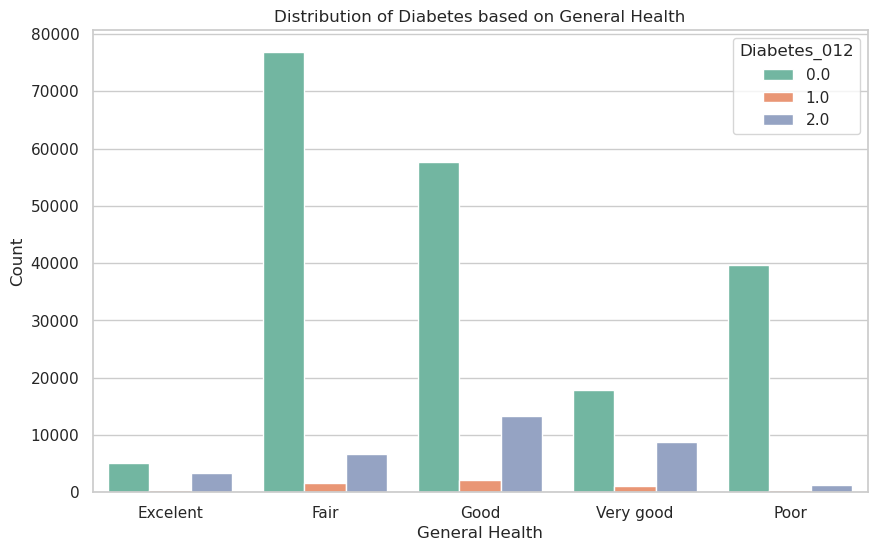

In [39]:
sb.set(style="whitegrid")

# Create a countplot
plt.figure(figsize=(10, 6))
sb.countplot(x='GenHlth', hue='Diabetes_012', data=df2, palette="Set2")

# Add labels and title
plt.xlabel('General Health')
plt.ylabel('Count')
plt.title('Distribution of Diabetes based on General Health')

# Show the plot
plt.show()

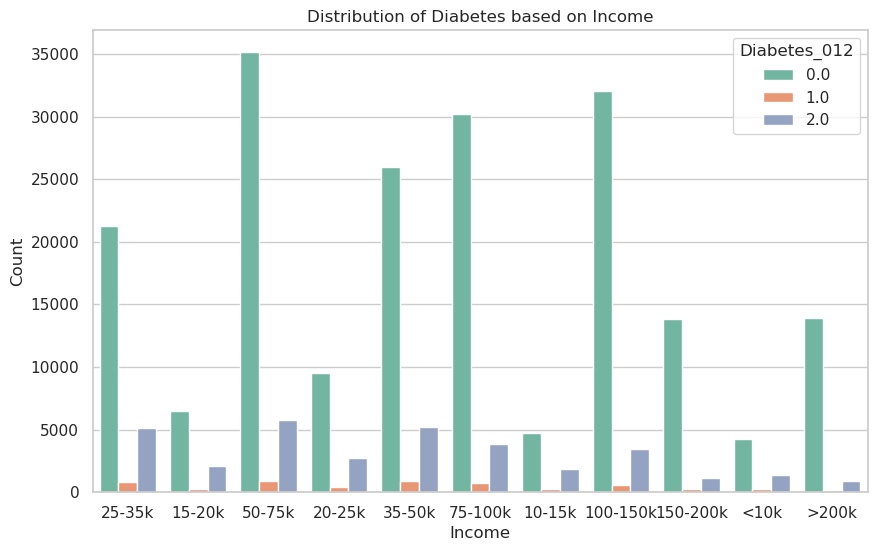

In [40]:
sb.set(style="whitegrid")

# Create a countplot
plt.figure(figsize=(10, 6))
sb.countplot(x='Income', hue='Diabetes_012', data=df2, palette="Set2")

# Add labels and title
plt.xlabel('Income')
plt.ylabel('Count')
plt.title('Distribution of Diabetes based on Income')

# Show the plot
plt.show()

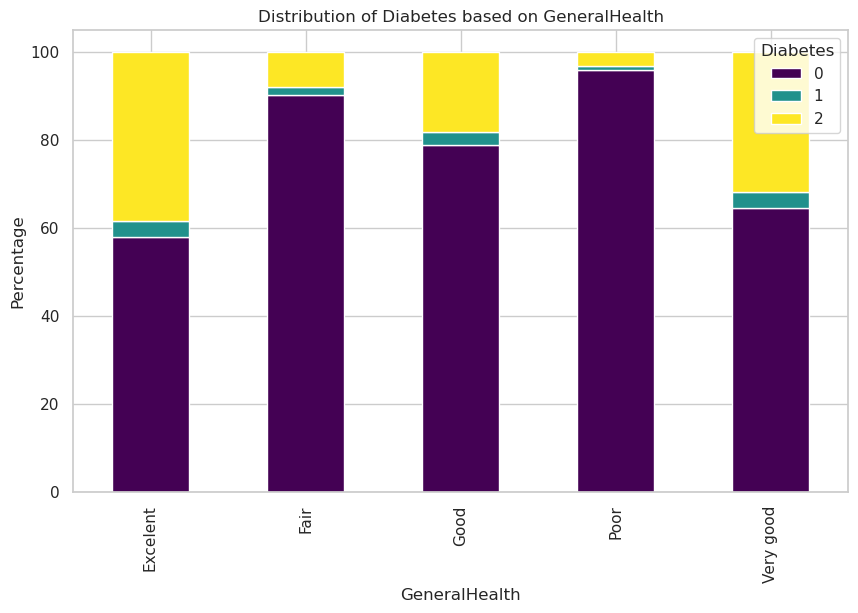

In [41]:
# Create a crosstab to get the count of Diabetes values for each GeneralHealth category
cross_tab = pd.crosstab(df2['GenHlth'], df2['Diabetes_012'], normalize='index') * 100

# Plot the stacked bar chart
ax = cross_tab.plot(kind='bar', stacked=True, colormap='viridis', figsize=(10, 6))
plt.title('Distribution of Diabetes based on GeneralHealth')
plt.xlabel('GeneralHealth')
plt.ylabel('Percentage')
plt.legend(title='Diabetes', loc='upper right', labels=['0', '1', '2'])
plt.show()

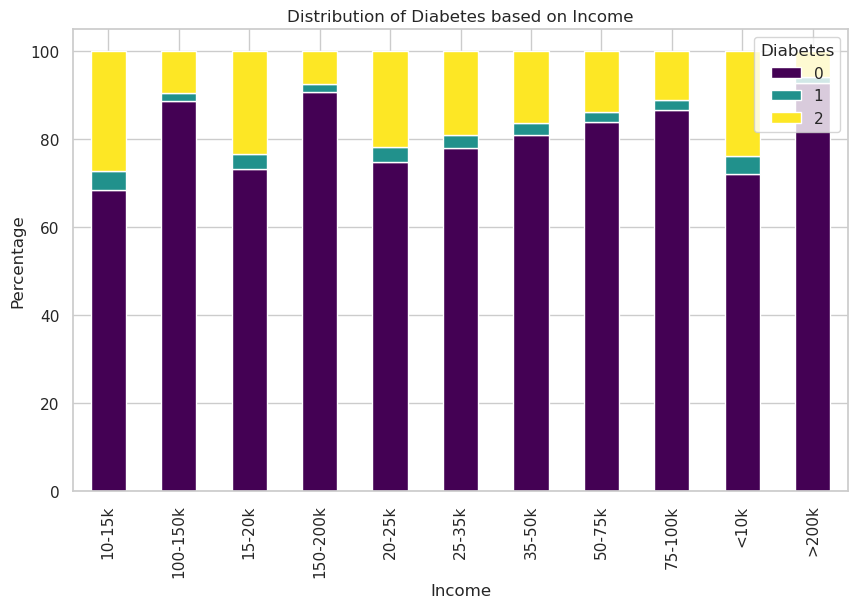

In [42]:
# Create a crosstab to get the count of Diabetes values for each GeneralHealth category
cross_tab = pd.crosstab(df2['Income'], df2['Diabetes_012'], normalize='index') * 100

# Plot the stacked bar chart
ax = cross_tab.plot(kind='bar', stacked=True, colormap='viridis', figsize=(10, 6))
plt.title('Distribution of Diabetes based on Income')
plt.xlabel('Income')
plt.ylabel('Percentage')
plt.legend(title='Diabetes', loc='upper right', labels=['0', '1', '2'])
plt.show()

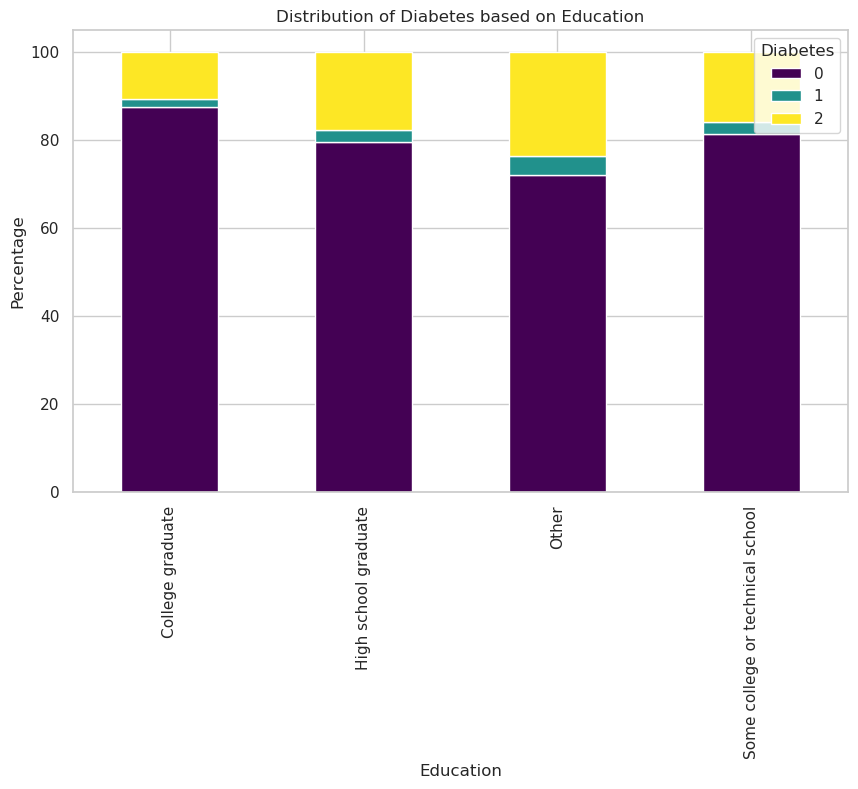

In [43]:
# Create a crosstab to get the count of Diabetes values for each GeneralHealth category
cross_tab = pd.crosstab(df2['Education'], df2['Diabetes_012'], normalize='index') * 100

# Plot the stacked bar chart
ax = cross_tab.plot(kind='bar', stacked=True, colormap='viridis', figsize=(10, 6))
plt.title('Distribution of Diabetes based on Education')
plt.xlabel('Education')
plt.ylabel('Percentage')
plt.legend(title='Diabetes', loc='upper right', labels=['0', '1', '2'])
plt.show()

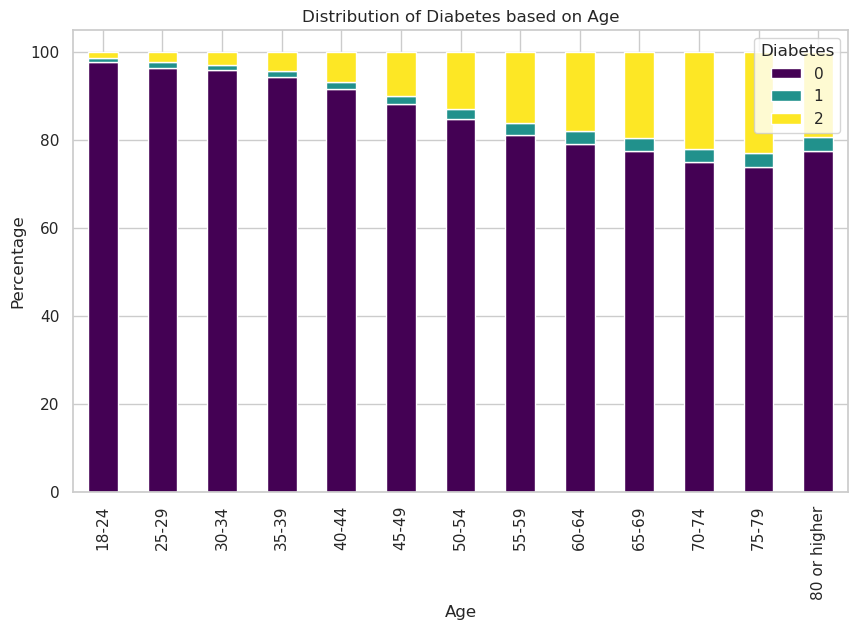

In [44]:
# Create a crosstab to get the count of Diabetes values for each GeneralHealth category
cross_tab = pd.crosstab(df2['Age'], df2['Diabetes_012'], normalize='index') * 100

# Plot the stacked bar chart
ax = cross_tab.plot(kind='bar', stacked=True, colormap='viridis', figsize=(10, 6))
plt.title('Distribution of Diabetes based on Age')
plt.xlabel('Age')
plt.ylabel('Percentage')
plt.legend(title='Diabetes', loc='upper right', labels=['0', '1', '2'])
plt.show()

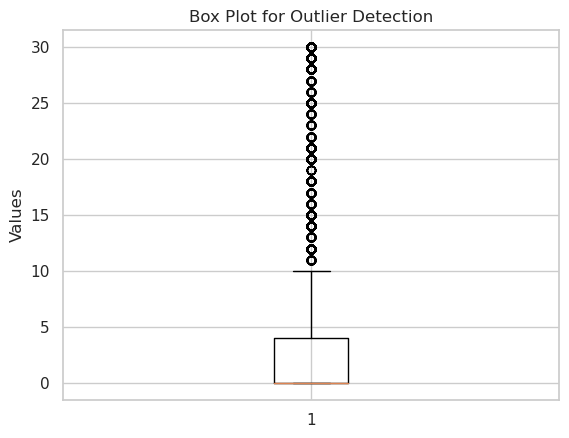

In [45]:
plt.boxplot(df['MentHlth'])
plt.title('Box Plot for Outlier Detection')
plt.ylabel('Values')
plt.show()

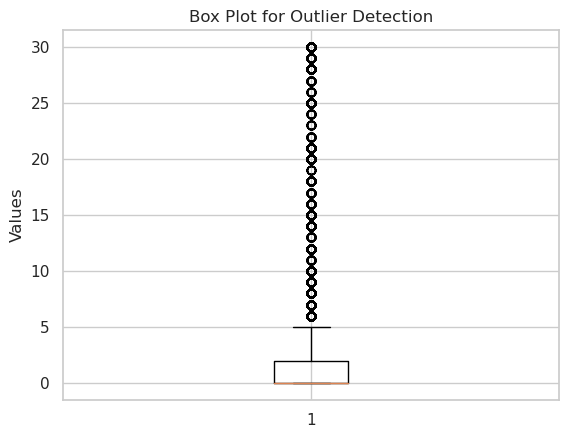

In [46]:
plt.boxplot(df['PhysHlth'])
plt.title('Box Plot for Outlier Detection')
plt.ylabel('Values')
plt.show()

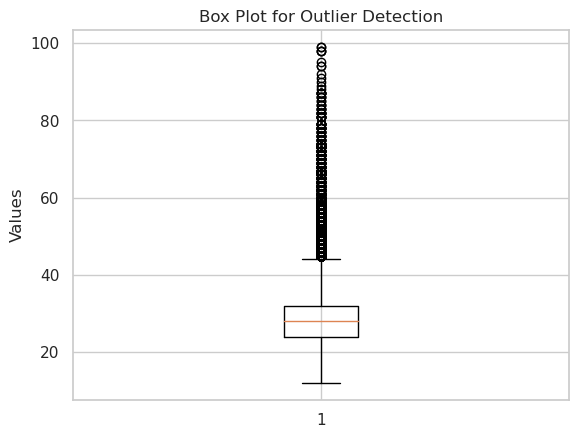

In [47]:
plt.boxplot(df['BMI'])
plt.title('Box Plot for Outlier Detection')
plt.ylabel('Values')
plt.show()

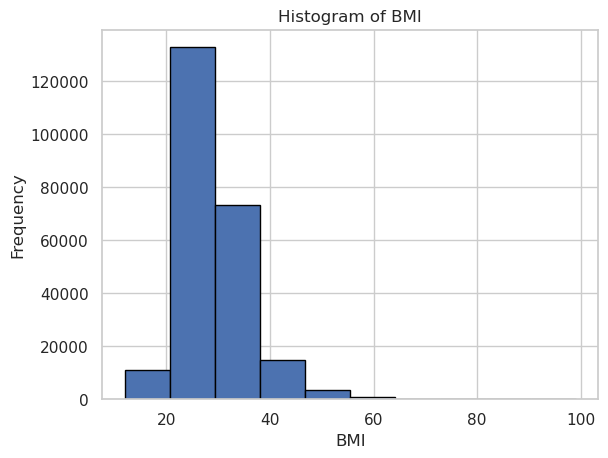

In [48]:
# Plot a histogram
plt.hist(df['BMI'], bins=10, edgecolor='black')
plt.title('Histogram of BMI')
plt.xlabel('BMI')
plt.ylabel('Frequency')
plt.show()

In [49]:
from scipy.stats import chi2_contingency

def cramers_v(confusion_matrix):
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k - 1) * (r - 1)) / (n - 1))
    rcorr = r - ((r - 1) ** 2) / (n - 1)
    kcorr = k - ((k - 1) ** 2) / (n - 1)
    return np.sqrt(phi2corr / min((kcorr - 1), (rcorr - 1)))

# Sample data

# Create a contingency table
contingency_table = pd.crosstab(df['Diabetes_012'], df['GenHlth'])

# Calculate Cramér's V using the custom function
cramers_v_value = cramers_v(contingency_table.to_numpy())

print(f"Cramér's V: {cramers_v_value}")


Cramér's V: 0.20846201701414432


In [50]:
contingency_table = pd.crosstab(df['Diabetes_012'], df['DiffWalk'])

# Calculate Cramér's V using the custom function
cramers_v_value = cramers_v(contingency_table.to_numpy())

print(f"Cramér's V: {cramers_v_value}")

Cramér's V: 0.21633922808865114


In [51]:
contingency_table = pd.crosstab(df['Diabetes_012'], df['Sex'])

# Calculate Cramér's V using the custom function
cramers_v_value = cramers_v(contingency_table.to_numpy())

print(f"Cramér's V: {cramers_v_value}")

Cramér's V: 0.034463426514789286


In [52]:
contingency_table = pd.crosstab(df['Diabetes_012'], df['Age'])

# Calculate Cramér's V using the custom function
cramers_v_value = cramers_v(contingency_table.to_numpy())

print(f"Cramér's V: {cramers_v_value}")

Cramér's V: 0.14594598653915639


In [53]:
contingency_table = pd.crosstab(df['Diabetes_012'], df['Education'])

# Calculate Cramér's V using the custom function
cramers_v_value = cramers_v(contingency_table.to_numpy())

print(f"Cramér's V: {cramers_v_value}")

Cramér's V: 0.0792045687858844


In [54]:
contingency_table = pd.crosstab(df['Diabetes_012'], df['NoDocbcCost'])

# Calculate Cramér's V using the custom function
cramers_v_value = cramers_v(contingency_table.to_numpy())

print(f"Cramér's V: {cramers_v_value}")

Cramér's V: 0.020249403258376254


In [55]:
contingency_table = pd.crosstab(df['Diabetes_012'], df['AnyHealthcare'])

# Calculate Cramér's V using the custom function
cramers_v_value = cramers_v(contingency_table.to_numpy())

print(f"Cramér's V: {cramers_v_value}")

Cramér's V: 0.02768481290059179


In [56]:
contingency_table = pd.crosstab(df['Diabetes_012'], df['Fruits'])

# Calculate Cramér's V using the custom function
cramers_v_value = cramers_v(contingency_table.to_numpy())

print(f"Cramér's V: {cramers_v_value}")

Cramér's V: 0.030758547217847626


In [57]:
contingency_table = pd.crosstab(df['Diabetes_012'], df['HighBP'])

# Calculate Cramér's V using the custom function
cramers_v_value = cramers_v(contingency_table.to_numpy())

print(f"Cramér's V: {cramers_v_value}")

Cramér's V: 0.26930391439043005


In [58]:
contingency_table = pd.crosstab(df['Diabetes_012'], df['HighChol'])

# Calculate Cramér's V using the custom function
cramers_v_value = cramers_v(contingency_table.to_numpy())

print(f"Cramér's V: {cramers_v_value}")

Cramér's V: 0.20898228889966455


In [59]:
contingency_table = pd.crosstab(df['Diabetes_012'], df['CholCheck'])

# Calculate Cramér's V using the custom function
cramers_v_value = cramers_v(contingency_table.to_numpy())

print(f"Cramér's V: {cramers_v_value}")

Cramér's V: 0.07272095087852579


In [60]:
contingency_table = pd.crosstab(df['Diabetes_012'], df['Smoker'])

# Calculate Cramér's V using the custom function
cramers_v_value = cramers_v(contingency_table.to_numpy())

print(f"Cramér's V: {cramers_v_value}")

Cramér's V: 0.05889167041951168


In [61]:
contingency_table = pd.crosstab(df['Diabetes_012'], df['Stroke'])

# Calculate Cramér's V using the custom function
cramers_v_value = cramers_v(contingency_table.to_numpy())

print(f"Cramér's V: {cramers_v_value}")

Cramér's V: 0.1028399458253706


In [62]:
contingency_table = pd.crosstab(df['Diabetes_012'], df['HeartDiseaseorAttack'])

# Calculate Cramér's V using the custom function
cramers_v_value = cramers_v(contingency_table.to_numpy())

print(f"Cramér's V: {cramers_v_value}")

Cramér's V: 0.17767076554768596


In [63]:
contingency_table = pd.crosstab(df['Diabetes_012'], df['PhysActivity'])

# Calculate Cramér's V using the custom function
cramers_v_value = cramers_v(contingency_table.to_numpy())

print(f"Cramér's V: {cramers_v_value}")

Cramér's V: 0.15163070320453262


In [64]:
contingency_table = pd.crosstab(df['Diabetes_012'], df['Veggies'])

# Calculate Cramér's V using the custom function
cramers_v_value = cramers_v(contingency_table.to_numpy())

print(f"Cramér's V: {cramers_v_value}")

Cramér's V: 0.04786976686893356


In [65]:
contingency_table = pd.crosstab(df['Diabetes_012'], df['HvyAlcoholConsump'])

# Calculate Cramér's V using the custom function
cramers_v_value = cramers_v(contingency_table.to_numpy())

print(f"Cramér's V: {cramers_v_value}")

Cramér's V: 0.05885671908923862


In [66]:
contingency_table = pd.crosstab(df['Diabetes_012'], df['AnyHealthcare'])

# Calculate Cramér's V using the custom function
cramers_v_value = cramers_v(contingency_table.to_numpy())

print(f"Cramér's V: {cramers_v_value}")

Cramér's V: 0.02768481290059179


In [67]:
contingency_table = pd.crosstab(df['Diabetes_012'], df['Income'])

# Calculate Cramér's V using the custom function
cramers_v_value = cramers_v(contingency_table.to_numpy())

print(f"Cramér's V: {cramers_v_value}")

Cramér's V: 0.11554985147013473


# SMOTE

In [41]:
X = df_encoded.drop(['Diabetes_012', 'Sex', 'NoDocbcCost',  'AnyHealthcare',
            'Fruits', 'Veggies', 'CholCheck', 'Smoker'], axis = 1).copy()
y = df_encoded['Diabetes_012'].copy()

In [40]:
X.drop('cluster', axis=1, inplace = True)

In [42]:
df_encoded.columns

Index(['Diabetes_012', 'HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker',
       'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Income',
       'Education_1.0', 'Education_2.0', 'Education_3.0', 'Education_4.0',
       'Education_5.0', 'Education_6.0'],
      dtype='object')

In [43]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify = y)

# Splitting data

In [12]:
x_train_corr = x_train[['BMI', 'GenHlth', 'MentHlth', 'PhysHlth']]

In [71]:
correlation_matrix = x_train_corr.corr()

In [13]:
from sklearn.preprocessing import StandardScaler

columns_to_normalize = ['MentHlth', 'PhysHlth', 'GenHlth', 'BMI']

# Extract the selected columns and normalize them
scaler = StandardScaler()
x_train[columns_to_normalize] = scaler.fit_transform(x_train[columns_to_normalize])

x_test[columns_to_normalize] = scaler.transform(x_test[columns_to_normalize]) #mean and std use from train x-mean/std

In [73]:
x_train.head()

,HighBP,HighChol,BMI,Stroke,HeartDiseaseorAttack,PhysActivity,HvyAlcoholConsump,GenHlth,MentHlth,PhysHlth,DiffWalk,Age,Income,Education_College graduate,Education_High school graduate,Education_Other,Education_Some college or technical school
32045,0,0.0,-0.144898,0.0,0.0,1,0,-0.466046,-0.499215,-0.454693,0.0,11,8.0,1.0,0.0,0.0,0.0
50234,1,1.0,-0.297658,0.0,0.0,1,0,0.506061,3.303960,-0.333341,0.0,12,6.0,0.0,1.0,0.0,0.0
124568,0,0.0,-0.908698,0.0,0.0,1,0,-0.466046,-0.499215,-0.454693,0.0,4,4.0,1.0,0.0,0.0,0.0
165686,1,1.0,-0.297658,0.0,0.0,0,0,0.506061,-0.499215,-0.454693,0.0,10,6.0,0.0,0.0,0.0,1.0
52339,0,0.0,-0.297658,0.0,0.0,1,0,-1.438154,2.036235,-0.454693,0.0,8,9.0,0.0,0.0,0.0,1.0


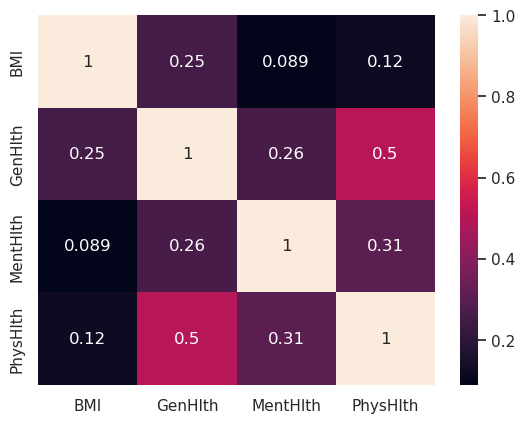

In [74]:
 sb.heatmap(correlation_matrix, annot = True)
# plt.rcParams["figure.figsize"] = (2,2)
 plt.show()

In [75]:
df.head()

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,0,1.0,1,15.0,1.0,0.0,0.0,0,1,...,1,0.0,5.0,10.0,20.0,0.0,0,11,High school graduate,5.0
1,2.0,1,0.0,1,28.0,0.0,0.0,1.0,0,1,...,1,0.0,2.0,0.0,0.0,0.0,0,11,High school graduate,3.0
2,2.0,1,1.0,1,33.0,0.0,0.0,0.0,1,1,...,1,0.0,2.0,10.0,0.0,0.0,0,9,High school graduate,7.0
3,2.0,0,1.0,1,29.0,0.0,1.0,1.0,1,1,...,1,0.0,5.0,0.0,30.0,1.0,1,12,Other,4.0
4,0.0,0,0.0,1,24.0,1.0,0.0,0.0,0,0,...,1,0.0,3.0,0.0,0.0,1.0,1,13,Some college or technical school,6.0


In [76]:
mapping_dict = {'Other' : 1,
                'High school graduate' : 2, 
                'Some college or technical school' : 3,
                'College graduate' : 4}

df['Education'] = df['Education'].replace(mapping_dict)

# Random forest

In [77]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
#from imblearn.combine import SMOTEENN

# Define your classifier and its parameters
classifier = RandomForestClassifier()

# Define the parameter grid to search
param_grid = {
    'clf__n_estimators': [25, 50, 100],
    'clf__max_depth': [None, 8, 10, 20]
}

# Define the pipeline with SMOTE and your classifier
pipeline = Pipeline([
    ('smote', SMOTE()),  # Apply SMOTE
    ('clf', classifier)  # Classifier
])

# Define a custom cross-validation strategy
cv = StratifiedKFold(n_splits=10)

# Perform grid search with your custom pipeline and cross-validation
grid_search = GridSearchCV(pipeline, param_grid, cv=cv, scoring='accuracy')

# Fit the grid search to your data
#grid_search.fit(x_train, y_train)  # X_train and y_train are your training data

# Fit the grid search to your data
try:
    grid_search.fit(x_train, y_train)  # X_train and y_train are your training data
except ValueError as e:
    print("Error during grid search:", e)

# Print the best hyperparameters found
print("Best parameters:", grid_search.best_params_)

# Print the best mean cross-validation score
print("Best cross-validation accuracy:", grid_search.best_score_)


Best parameters: {'clf__max_depth': None, 'clf__n_estimators': 100}
Best cross-validation accuracy: 0.799430972284352


In [30]:
from interpret.blackbox import LimeTabular
from interpret import show
import shap
shap.initjs()

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [44]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(
            max_depth = None,
            n_estimators = 100
)

rf.fit(x_train, y_train)

y_pred = rf.predict(x_test)

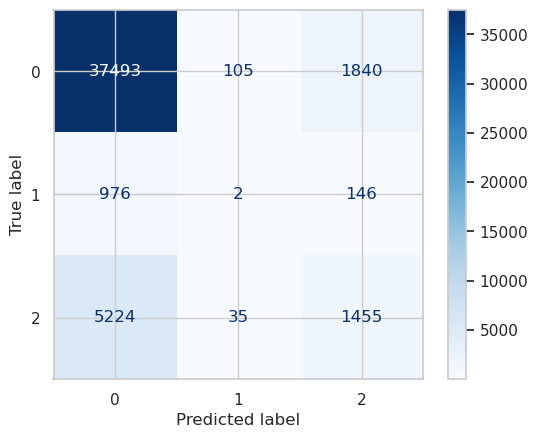

              precision    recall  f1-score       support
0.0            0.858101  0.950682  0.902022  39438.000000
1.0            0.014085  0.001779  0.003160   1124.000000
2.0            0.422842  0.216711  0.286558   6714.000000
accuracy       0.823885  0.823885  0.823885      0.823885
macro avg      0.431676  0.389724  0.397247  47276.000000
weighted avg   0.776220  0.823885  0.793245  47276.000000


In [79]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import warnings
warnings.filterwarnings('ignore')


conf_mat = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix = conf_mat, display_labels = ['0', '1', '2'])
disp.plot(cmap = "Blues")

plt.show()


rf_report = classification_report(y_test, y_pred, output_dict=True)

rf_report_df = pd.DataFrame(rf_report).T
print(rf_report_df)

In [80]:
import lime
import lime.lime_tabular

feature_names = x_train.columns.tolist()

# Step 3: Use LIME to explain individual predictions
explainer = lime.lime_tabular.LimeTabularExplainer(x_train.values,
                                                   feature_names=feature_names,
                                                   class_names=y_train.unique(),
                                                   discretize_continuous=True)

# Example: Explain a prediction
# Pick an instance from your test set
instance = x_test.iloc[0]

# Explain the prediction
exp = explainer.explain_instance(instance.values, rf.predict_proba, num_features=len(feature_names))

# Print the explanation
exp.show_in_notebook(show_table=True)

In [45]:
explainer = shap.TreeExplainer(rf)

start_index = 67
end_index = 68
shap_values = explainer.shap_values(x_test[start_index:end_index])
x_test[start_index:end_index]

,HighBP,HighChol,BMI,Stroke,HeartDiseaseorAttack,PhysActivity,HvyAlcoholConsump,GenHlth,MentHlth,PhysHlth,DiffWalk,Age,Income,Education_1.0,Education_2.0,Education_3.0,Education_4.0,Education_5.0,Education_6.0
202022,0,0.0,21.0,0.0,0.0,1,0,1.0,5.0,0.0,0.0,6,9.0,0.0,0.0,0.0,0.0,1.0,0.0


In [46]:
prediction = rf.predict(x_test[start_index:end_index])[0]
print(f"The TF predicted: {prediction}")
shap.force_plot(explainer.expected_value[1],
                         shap_values[1],
                        x_test[start_index:end_index])

The TF predicted: 0.0


In [34]:
x_test.drop('cluster', axis=1, inplace = True)

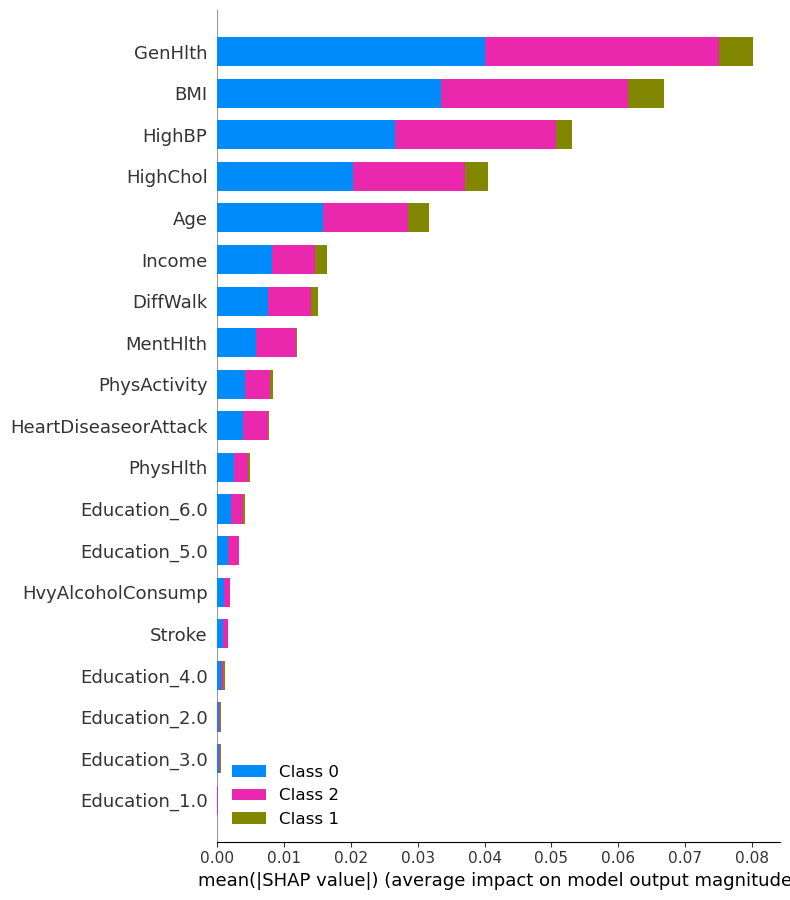

In [47]:
shap.summary_plot(shap_values, x_test)

In [81]:
from sklearn.datasets import load_iris
data = load_iris()
X = data.data
y = data.target
class_names = data.target_names
print(class_names)
print(data.feature_names)
print(x_train.columns.tolist())

['setosa' 'versicolor' 'virginica']
['sepal length (cm)', 'sepal width (cm)', 'petal length (cm)', 'petal width (cm)']
['HighBP', 'HighChol', 'BMI', 'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'HvyAlcoholConsump', 'GenHlth', 'MentHlth', 'PhysHlth', 'DiffWalk', 'Age', 'Income', 'Education_College graduate', 'Education_High school graduate', 'Education_Other', 'Education_Some college or technical school']


# Logistic Regression

In [14]:
import warnings
warnings.filterwarnings('ignore')

parameters = {
    'penalty' : ['l1', 'l2'],
    'C' : np.logspace(-3, 3, 7),
    'solver' : ['newton-cg', 'lbfgs', 'liblinear'],
}

In [83]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier

# Define your classifier and its parameters
classifier = LogisticRegression()

# Define the parameter grid to search
param_grid = {
    'clf__penalty' : ['l1', 'l2'],
    'clf__C' : np.logspace(-3, 3, 7),
    'clf__solver' : ['newton-cg', 'lbfgs', 'liblinear'],
}

# Define the pipeline with SMOTE and your classifier
pipeline = Pipeline([
    ('smote', SMOTE()),  # Apply SMOTE
    ('clf', classifier)  # Classifier
])

# Define a custom cross-validation strategy
cv = StratifiedKFold(n_splits=10)

# Perform grid search with your custom pipeline and cross-validation
grid_search = GridSearchCV(pipeline, param_grid, cv=cv, scoring='accuracy')

# Fit the grid search to your data
#grid_search.fit(x_train, y_train)  # X_train and y_train are your training data

# Fit the grid search to your data
try:
    grid_search.fit(x_train, y_train)  # X_train and y_train are your training data
except ValueError as e:
    print("Error during grid search:", e)

# Print the best hyperparameters found
print("Best parameters:", grid_search.best_params_)

# Print the best mean cross-validation score
print("Best cross-validation accuracy:", grid_search.best_score_)


Best parameters: {'clf__C': 0.001, 'clf__penalty': 'l2', 'clf__solver': 'liblinear'}
Best cross-validation accuracy: 0.6459846939242047


In [15]:
logreg = LogisticRegression(C = 0.001,
                           penalty = 'l2',
                           solver = 'liblinear')
logreg.fit(x_train, y_train)

y_pred = logreg.predict(x_test)

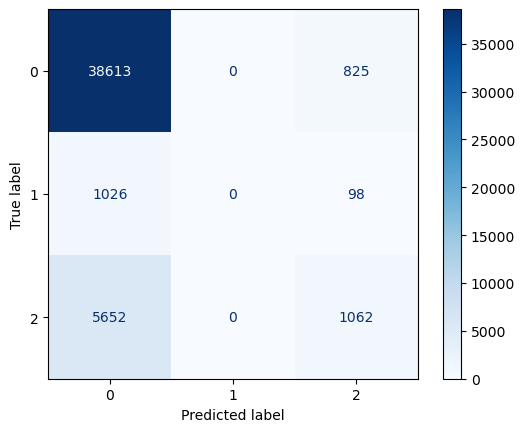

              precision    recall  f1-score       support
0.0            0.852553  0.979081  0.911447  39438.000000
1.0            0.000000  0.000000  0.000000   1124.000000
2.0            0.535013  0.158177  0.244166   6714.000000
accuracy       0.839221  0.839221  0.839221      0.839221
macro avg      0.462522  0.379086  0.385204  47276.000000
weighted avg   0.787188  0.839221  0.795012  47276.000000


In [16]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import warnings
warnings.filterwarnings('ignore')


conf_mat = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix = conf_mat, display_labels = ['0', '1', '2'])
disp.plot(cmap = "Blues")

plt.show()

lr_report = classification_report(y_test, y_pred, output_dict=True)

lr_report_df = pd.DataFrame(lr_report).T
print(lr_report_df)

In [17]:
import lime
import lime.lime_tabular

feature_names = x_train.columns.tolist()

# Step 3: Use LIME to explain individual predictions
explainer = lime.lime_tabular.LimeTabularExplainer(x_train.values,
                                                   feature_names=feature_names,
                                                   class_names=y_train.unique(),
                                                   discretize_continuous=True)

# Example: Explain a prediction
# Pick an instance from your test set
instance = x_test.iloc[0]

# Explain the prediction
exp = explainer.explain_instance(instance.values, logreg.predict_proba, num_features=len(feature_names))

# Print the explanation
exp.show_in_notebook(show_table=True)

# KNN

In [87]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline


classifier = KNeighborsClassifier()

param_grid = {
    'clf__n_neighbors' : np.arange(1, 25),
    'clf__weights' : ('uniform', 'distance'),
    'clf__metric' : ('minkowski', 'chebyshev')
}


# Define the pipeline with SMOTE and your classifier
pipeline = Pipeline([
    ('smote', SMOTE()),  # Apply SMOTE
    ('clf', classifier)  # Classifier
])

cv = StratifiedKFold(n_splits=10)

# Perform grid search with your custom pipeline and cross-validation
grid_search = GridSearchCV(pipeline, param_grid, cv=cv, scoring='accuracy')

# Fit the grid search to your data
#grid_search.fit(x_train, y_train)  # X_train and y_train are your training data

# Fit the grid search to your data
try:
    grid_search.fit(x_train, y_train)  # X_train and y_train are your training data
except ValueError as e:
    print("Error during grid search:", e)


# Print the best hyperparameters found
print("Best parameters:", grid_search.best_params_)

# Print the best mean cross-validation score
print("Best cross-validation accuracy:", grid_search.best_score_)

Best parameters: {'clf__metric': 'minkowski', 'clf__n_neighbors': 2, 'clf__weights': 'uniform'}
Best cross-validation accuracy: 0.7408329954158337


In [162]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors = 2, weights = 'uniform', metric = 'minkowski')

knn.fit(x_train, y_train)

y_pred = knn.predict(x_test)
print("Accuracy:", sklearn.metrics.accuracy_score(y_test, y_pred))
print("F1 Score: ", f1_score(y_test, y_pred, average = 'macro'))

Accuracy: 0.8172011168457568
F1 Score:  0.35489504308178765


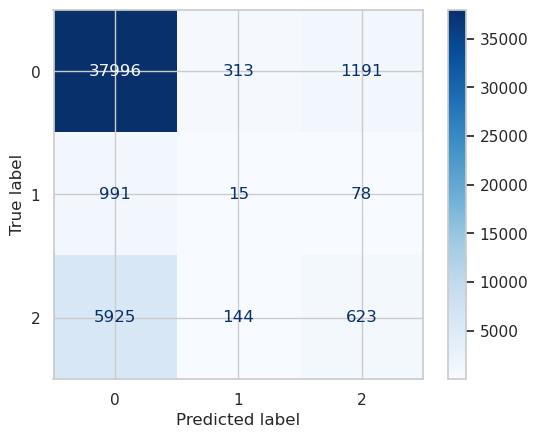

              precision    recall  f1-score       support
0.0            0.846010  0.961924  0.900251  39500.000000
1.0            0.031780  0.013838  0.019280   1084.000000
2.0            0.329281  0.093096  0.145154   6692.000000
accuracy       0.817201  0.817201  0.817201      0.817201
macro avg      0.402357  0.356286  0.354895  47276.000000
weighted avg   0.754196  0.817201  0.773166  47276.000000


In [163]:
conf_mat = confusion_matrix(y_test, y_pred)

knn_report = classification_report(y_test, y_pred, output_dict=True)
disp = ConfusionMatrixDisplay(confusion_matrix = conf_mat, display_labels = ['0', '1', '2'])
disp.plot(cmap = "Blues")

plt.show()

knn_report_df = pd.DataFrame(knn_report).T
print(knn_report_df)

In [90]:
import lime
import lime.lime_tabular

feature_names = x_train.columns.tolist()

# Step 3: Use LIME to explain individual predictions
explainer = lime.lime_tabular.LimeTabularExplainer(x_train.values,
                                                   feature_names=feature_names,
                                                   class_names=y_train.unique(),
                                                   discretize_continuous=True)

# Example: Explain a prediction
# Pick an instance from your test set
instance = x_test.iloc[0]

# Explain the prediction
exp = explainer.explain_instance(instance.values, knn.predict_proba, num_features=len(feature_names))

# Print the explanation
exp.show_in_notebook(show_table=True)

# XGBClassifier

In [91]:
import xgboost as xgb


pipeline = Pipeline([
    ('sampling', SMOTE(random_state=42)),  # Adding SMOTE into the pipeline
    ('xgb', xgb.XGBClassifier(objective='multi:softmax', num_class=3, verbosity=0))
])

# Set the parameters grid for grid search
param_grid = {
    'xgb__max_depth': [3, 4, 5],
    'xgb__learning_rate': [0.1, 0.01, 0.001],
    'xgb__n_estimators': [50, 100, 150],
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=3, scoring='accuracy')

# Fit the model
grid_search.fit(x_train, y_train)

# Get the best parameters and the best accuracy
best_params = grid_search.best_params_
best_accuracy = grid_search.best_score_

print("Best Parameters:", best_params)
print("Best Accuracy:", best_accuracy)

Best Parameters: {'xgb__learning_rate': 0.1, 'xgb__max_depth': 5, 'xgb__n_estimators': 150}
Best Accuracy: 0.8148882613615932


In [164]:
import xgboost as xgb

xgb_model =xgb.XGBClassifier(max_depth = 5, 
                          learning_rate = 0.1,
                          n_estimators = 150)

xgb_model.fit(x_train, y_train)

y_pred = xgb_model.predict(x_test)
print("Accuracy:", sklearn.metrics.accuracy_score(y_test, y_pred))
print("F1 Score: ", f1_score(y_test, y_pred, average = 'macro'))

Accuracy: 0.836555546154497
F1 Score:  0.34300443709965234


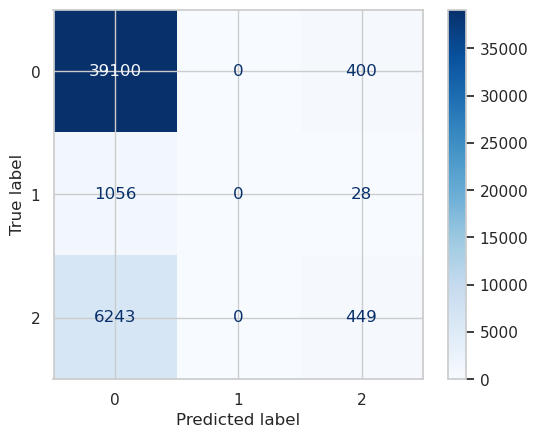

              precision    recall  f1-score       support
0.0            0.842691  0.989873  0.910371  39500.000000
1.0            0.000000  0.000000  0.000000   1084.000000
2.0            0.511973  0.067095  0.118642   6692.000000
accuracy       0.836556  0.836556  0.836556      0.836556
macro avg      0.451554  0.352323  0.343004  47276.000000
weighted avg   0.776555  0.836556  0.777427  47276.000000


In [165]:
conf_mat = confusion_matrix(y_test, y_pred)

xgb_report = classification_report(y_test, y_pred, output_dict=True)
disp = ConfusionMatrixDisplay(confusion_matrix = conf_mat, display_labels = ['0', '1', '2'])
disp.plot(cmap = "Blues")

plt.show()

xgb_report_df = pd.DataFrame(xgb_report).T
print(xgb_report_df)

In [94]:
import lime
import lime.lime_tabular

feature_names = x_train.columns.tolist()

# Step 3: Use LIME to explain individual predictions
explainer = lime.lime_tabular.LimeTabularExplainer(x_train.values,
                                                   feature_names=feature_names,
                                                   class_names=y_train.unique(),
                                                   discretize_continuous=True)

# Example: Explain a prediction
# Pick an instance from your test set
instance = x_test.iloc[0]

# Explain the prediction
exp = explainer.explain_instance(instance.values, xgb_model.predict_proba, num_features=len(feature_names))

# Print the explanation
exp.show_in_notebook(show_table=True)

# AdaBoost

In [95]:
from sklearn.ensemble import AdaBoostClassifier

classifier = AdaBoostClassifier()

# Define hyperparameters grid for grid search
param_grid = {
    'clf__n_estimators': [50, 100, 150],  # Number of weak learners (decision trees)
    'clf__learning_rate': [0.01, 0.1, 1.0]  # Learning rate (contribution of weak learners)
}



# Define the pipeline with SMOTE and your classifier
pipeline = Pipeline([
    ('smote', SMOTE()),  # Apply SMOTE
    ('clf', classifier)  # Classifier
])

cv = StratifiedKFold(n_splits=10)

# Perform grid search with your custom pipeline and cross-validation
grid_search = GridSearchCV(pipeline, param_grid, cv=cv, scoring='accuracy')

# Fit the grid search to your data
#grid_search.fit(x_train, y_train)  # X_train and y_train are your training data

# Fit the grid search to your data
try:
    grid_search.fit(x_train, y_train)  # X_train and y_train are your training data
except ValueError as e:
    print("Error during grid search:", e)


# Print the best hyperparameters found
print("Best parameters:", grid_search.best_params_)

# Print the best mean cross-validation score
print("Best cross-validation accuracy:", grid_search.best_score_)

Best parameters: {'clf__learning_rate': 1.0, 'clf__n_estimators': 150}
Best cross-validation accuracy: 0.7319964972163158


In [96]:
from sklearn.ensemble import AdaBoostClassifier

ab = AdaBoostClassifier(
            n_estimators = 150,
            learning_rate = 1.0
)

ab.fit(x_train, y_train)

y_pred = ab.predict(x_test)

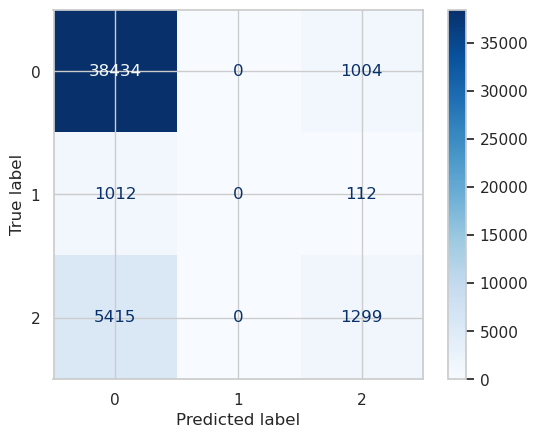

              precision    recall  f1-score       support
0.0            0.856735  0.974542  0.911849  39438.000000
1.0            0.000000  0.000000  0.000000   1124.000000
2.0            0.537888  0.193476  0.284588   6714.000000
accuracy       0.840448  0.840448  0.840448      0.840448
macro avg      0.464874  0.389340  0.398812  47276.000000
weighted avg   0.791084  0.840448  0.801088  47276.000000


In [97]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import warnings
warnings.filterwarnings('ignore')


conf_mat = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix = conf_mat, display_labels = ['0', '1', '2'])
disp.plot(cmap = "Blues")

plt.show()

ab_report = classification_report(y_test, y_pred, output_dict=True)

ab_report_df = pd.DataFrame(ab_report).T
print(ab_report_df)

In [98]:
import lime
import lime.lime_tabular

feature_names = x_train.columns.tolist()

# Step 3: Use LIME to explain individual predictions
explainer = lime.lime_tabular.LimeTabularExplainer(x_train.values,
                                                   feature_names=feature_names,
                                                   class_names=y_train.unique(),
                                                   discretize_continuous=True)

# Example: Explain a prediction
# Pick an instance from your test set
instance = x_test.iloc[0]

# Explain the prediction
exp = explainer.explain_instance(instance.values, ab.predict_proba, num_features=len(feature_names))

# Print the explanation
exp.show_in_notebook(show_table=True)

# Results

In [166]:
import tabulate
from tabulate import tabulate

data = [
    ["Random Forest",rf_report_df.precision[3], rf_report_df.precision[4], rf_report_df.recall[4], rf_report_df['f1-score'][4]],
    ["Logistic Regression", lr_report_df.precision[3], lr_report_df.precision[4], lr_report_df.recall[4], lr_report_df['f1-score'][4]],
    ["KNN",knn_report_df.precision[3], knn_report_df.precision[4], knn_report_df.recall[4], knn_report_df['f1-score'][4]],
    ["XGBoost", xgb_report_df.precision[3], xgb_report_df.precision[4], xgb_report_df.recall[4], xgb_report_df['f1-score'][4]],
    ["Ada Boost", ab_report_df.precision[3], ab_report_df.precision[4], ab_report_df.recall[4],ab_report_df['f1-score'][4]]
]

headers = ["","accuracy", "precision", "recall", "f1-score"]


print(tabulate(data, headers=headers, tablefmt="grid"))

+---------------------+------------+-------------+----------+------------+
|                     |   accuracy |   precision |   recall |   f1-score |
+=====================+============+=============+==========+============+
| Random Forest       |   0.816672 |    0.400819 | 0.367816 |   0.369759 |
+---------------------+------------+-------------+----------+------------+
| Logistic Regression |   0.834461 |    0.439854 | 0.368698 |   0.370449 |
+---------------------+------------+-------------+----------+------------+
| KNN                 |   0.817201 |    0.402357 | 0.356286 |   0.354895 |
+---------------------+------------+-------------+----------+------------+
| XGBoost             |   0.836556 |    0.451554 | 0.352323 |   0.343004 |
+---------------------+------------+-------------+----------+------------+
| Ada Boost           |   0.83975  |    0.463006 | 0.374945 |   0.379672 |
+---------------------+------------+-------------+----------+------------+


# Multilayer Perceptron

In [100]:
# from sklearn.neural_network import MLPClassifier


# classifier = MLPClassifier()

# # Define hyperparameters to search
# param_grid = {
#     'clf__hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50)],
#     'clf__activation': ['relu', 'tanh'],
#     'clf__alpha': [0.0001, 0.001, 0.01],
#     'clf__learning_rate': ['constant', 'adaptive'],
# }

# # Define the pipeline with SMOTE and your classifier
# pipeline = Pipeline([
#     ('smote', SMOTE()),  # Apply SMOTE
#     ('clf', classifier)  # Classifier
# ])

# cv = StratifiedKFold(n_splits=10)

# # Perform grid search with your custom pipeline and cross-validation
# grid_search = GridSearchCV(pipeline, param_grid, cv=cv, scoring='accuracy')

# # Fit the grid search to your data
# #grid_search.fit(x_train, y_train)  # X_train and y_train are your training data

# # Fit the grid search to your data
# try:
#     grid_search.fit(x_train, y_train)  # X_train and y_train are your training data
# except ValueError as e:
#     print("Error during grid search:", e)


# # Print the best hyperparameters found
# print("Best parameters:", grid_search.best_params_)

# # Print the best mean cross-validation score
# print("Best cross-validation accuracy:", grid_search.best_score_)

In [101]:
# mlp = MLPClassifier(hidden_layer_sizes = (50, 50),
#                     activation = 'tanh',
#                     alpha = 0.01,
#                     learning_rate = 'adaptive')

# mlp.fit(x_train, y_train)

# y_pred = mlp.predict(x_test)
# print("Accuracy:", sklearn.metrics.accuracy_score(y_test, y_pred))
# print("F1 Score: ", f1_score(y_test, y_pred, average = 'macro'))

In [102]:
# conf_mat = confusion_matrix(y_test, y_pred)

# mlp_report = classification_report(y_test, y_pred, output_dict=True)

# mlp_report_df = pd.DataFrame(mlp_report).T
# print(mlp_report_df)

# PCA

In [125]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X =  df_encoded.drop(['Diabetes_012', 'Sex', 'NoDocbcCost',  'AnyHealthcare',
            'Fruits', 'Veggies', 'CholCheck', 'Smoker' ], axis = 1).copy()
y = df_encoded['Diabetes_012'].copy()
x_std =scaler.fit_transform(X)
x_std

array([[-0.84844753,  1.21950588, -2.12965359, ...,  1.8659754 ,
        -0.20861289, -0.61831982],
       [ 1.17862327, -0.82000425, -0.14553916, ...,  1.8659754 ,
        -0.20861289, -0.61831982],
       [ 1.17862327,  1.21950588,  0.61758178, ...,  1.8659754 ,
        -0.20861289, -0.61831982],
       ...,
       [-0.84844753,  1.21950588,  0.3123334 , ..., -0.53591274,
        -0.20861289, -0.61831982],
       [ 1.17862327, -0.82000425, -0.7560359 , ...,  1.8659754 ,
        -0.20861289, -0.61831982],
       [-0.84844753,  1.21950588,  0.46495759, ..., -0.53591274,
        -0.20861289, -0.61831982]])

In [126]:
from sklearn.decomposition import PCA
pca = PCA()
pca.fit_transform(x_std)

array([[ 2.57952700e+00, -4.52640349e-01,  4.67251217e-01, ...,
         9.38927268e-01, -5.63601566e-01,  2.93170012e-12],
       [ 1.94745978e+00,  3.55191068e-01, -1.71489160e+00, ...,
        -2.26228253e-01,  7.53309449e-01, -1.24252530e-13],
       [ 5.70695410e-01,  1.12096755e-01, -1.01317510e+00, ...,
         6.26771869e-02,  3.03328730e-01, -1.37104480e-14],
       ...,
       [-1.70733146e+00,  1.18985942e+00,  4.23568619e-01, ...,
         1.49091636e-01, -9.68925261e-02, -3.96424864e-17],
       [-8.26804228e-02, -2.28004762e-01, -1.48284286e+00, ...,
        -1.76101381e-01,  1.34451718e-01, -1.04800481e-17],
       [-1.45167662e+00,  5.99178289e-01,  4.15012910e-01, ...,
        -3.47680239e-01,  1.01740595e+00,  3.87385422e-16]])

In [127]:
pca.get_covariance()

array([[ 1.00000423,  0.28328617,  0.21395219,  0.12659455,  0.2031917 ,
        -0.13225307, -0.00342392,  0.28155648,  0.01174351,  0.14094702,
         0.20826333,  0.34539154, -0.15029244, -0.10676513,  0.07173752,
         0.03937271,  0.03456465],
       [ 0.28328617,  1.00000423,  0.0871886 ,  0.08594776,  0.17066905,
        -0.07664791, -0.01427471,  0.18710165,  0.01985144,  0.10484604,
         0.12766759,  0.28793794, -0.0681958 , -0.0313079 ,  0.0200605 ,
         0.020134  ,  0.00720573],
       [ 0.21395219,  0.0871886 ,  1.00000423,  0.01024126,  0.039518  ,
        -0.16397988, -0.03264389,  0.2548358 ,  0.08845582,  0.12097688,
         0.19916558, -0.05016085, -0.10248783, -0.11017756,  0.0544246 ,
         0.0339635 ,  0.05689784],
       [ 0.12659455,  0.08594776,  0.01024126,  1.00000423,  0.17766819,
        -0.07875955, -0.01376854,  0.15972369,  0.04517612,  0.13195512,
         0.16256274,  0.12889272, -0.11500412, -0.05773226,  0.02955527,
         0.03825424

In [128]:
explained_variance=pca.explained_variance_ratio_
explained_variance

array([1.93366591e-01, 9.67326595e-02, 8.47510356e-02, 7.91103831e-02,
       6.49387767e-02, 6.19451596e-02, 5.90645134e-02, 5.27701352e-02,
       5.14562834e-02, 4.68518706e-02, 4.42087542e-02, 3.98561316e-02,
       3.61731794e-02, 3.29672659e-02, 2.95831060e-02, 2.62241552e-02,
       2.29697671e-30])

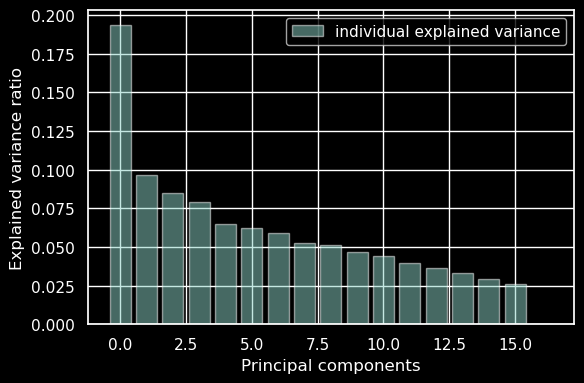

In [129]:
with plt.style.context('dark_background'):
    plt.figure(figsize=(6, 4))

    plt.bar(range(17), explained_variance, alpha=0.5, align='center',
            label='individual explained variance')
    plt.ylabel('Explained variance ratio')
    plt.xlabel('Principal components')
    plt.legend(loc='best')
    plt.tight_layout()

In [130]:
sum =0
number_of_components = 0
for i in range(0, 28):
    sum += explained_variance[i]
    if(sum >= 0.95):
        print(i)
        number_of_components = i
        break



14


In [131]:
pca=PCA(n_components=number_of_components)
x_new=pca.fit_transform(x_std)
x_new

array([[ 2.579527  , -0.45264035,  0.46725122, ...,  0.45469801,
         1.31282304, -1.49312415],
       [ 1.94745978,  0.35519107, -1.7148916 , ..., -1.85917547,
        -0.59945076, -0.26779425],
       [ 0.57069541,  0.11209675, -1.0131751 , ..., -0.32220358,
         0.17589475,  0.80677305],
       ...,
       [-1.70733146,  1.18985942,  0.42356862, ...,  1.24929994,
        -0.05048169,  0.10941983],
       [-0.08268042, -0.22800476, -1.48284286, ..., -1.0727517 ,
         0.56133527,  0.17244727],
       [-1.45167662,  0.59917829,  0.41501291, ...,  0.87079422,
        -1.3159302 , -0.19617955]])

In [132]:
y

0         0.0
1         2.0
2         2.0
3         2.0
4         0.0
         ... 
236373    2.0
236374    0.0
236375    0.0
236376    0.0
236377    0.0
Name: Diabetes_012, Length: 236378, dtype: float64

In [133]:
x_train, x_test, y_train, y_test = train_test_split(x_new, y, test_size=0.2, random_state=1)

# Random Forest PCA95

In [134]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
#from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from imblearn.combine import SMOTEENN

# Define your classifier and its parameters
classifier = RandomForestClassifier()

# Define the parameter grid to search
param_grid = {
    'clf__n_estimators': [25, 50, 100],
    'clf__max_depth': [None, 8, 10, 20]
}

# Define the pipeline with SMOTE and your classifier
pipeline = Pipeline([
    ('smote', SMOTE()),  # Apply SMOTE
    ('clf', classifier)  # Classifier
])

# Define a custom cross-validation strategy
cv = StratifiedKFold(n_splits=10)

# Perform grid search with your custom pipeline and cross-validation
grid_search = GridSearchCV(pipeline, param_grid, cv=cv, scoring='accuracy')

# Fit the grid search to your data
#grid_search.fit(x_train, y_train)  # X_train and y_train are your training data

# Fit the grid search to your data
try:
    grid_search.fit(x_train, y_train)  # X_train and y_train are your training data
except ValueError as e:
    print("Error during grid search:", e)

# Print the best hyperparameters found
print("Best parameters:", grid_search.best_params_)

# Print the best mean cross-validation score
print("Best cross-validation accuracy:", grid_search.best_score_)


Best parameters: {'clf__max_depth': None, 'clf__n_estimators': 100}
Best cross-validation accuracy: 0.7474696326562501


In [135]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(
            max_depth = None,
            n_estimators = 100
)

rf.fit(x_train, y_train)

y_pred = rf.predict(x_test)

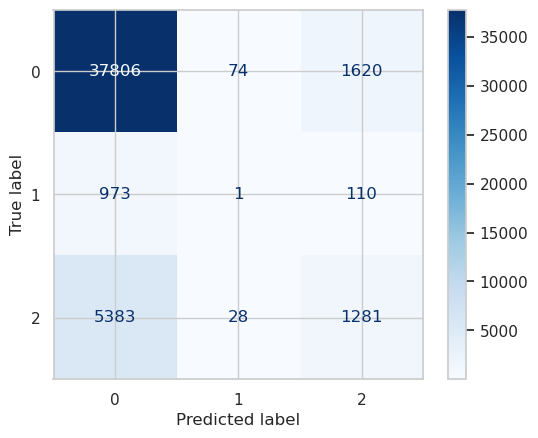

              precision    recall  f1-score       support
0.0            0.856075  0.957114  0.903779  39500.000000
1.0            0.009709  0.000923  0.001685   1084.000000
2.0            0.425440  0.191423  0.264042   6692.000000
accuracy       0.826804  0.826804  0.826804      0.826804
macro avg      0.430408  0.383153  0.389835  47276.000000
weighted avg   0.775712  0.826804  0.792539  47276.000000


In [137]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import warnings
warnings.filterwarnings('ignore')


conf_mat = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix = conf_mat, display_labels = ['0', '1', '2'])
disp.plot(cmap = "Blues")

plt.show()


rf_report = classification_report(y_test, y_pred, output_dict=True)

rf_report_df = pd.DataFrame(rf_report).T
print(rf_report_df)

# Logistic Regression PCA95

In [138]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier

# Define your classifier and its parameters
classifier = LogisticRegression()

# Define the parameter grid to search
param_grid = {
    'clf__penalty' : ['l1', 'l2'],
    'clf__C' : np.logspace(-3, 3, 7),
    'clf__solver' : ['newton-cg', 'lbfgs', 'liblinear'],
}

# Define the pipeline with SMOTE and your classifier
pipeline = Pipeline([
    ('smote', SMOTE()),  # Apply SMOTE
    ('clf', classifier)  # Classifier
])

# Define a custom cross-validation strategy
cv = StratifiedKFold(n_splits=10)

# Perform grid search with your custom pipeline and cross-validation
grid_search = GridSearchCV(pipeline, param_grid, cv=cv, scoring='accuracy')

# Fit the grid search to your data
#grid_search.fit(x_train, y_train)  # X_train and y_train are your training data

# Fit the grid search to your data
try:
    grid_search.fit(x_train, y_train)  # X_train and y_train are your training data
except ValueError as e:
    print("Error during grid search:", e)

# Print the best hyperparameters found
print("Best parameters:", grid_search.best_params_)

# Print the best mean cross-validation score
print("Best cross-validation accuracy:", grid_search.best_score_)


Best parameters: {'clf__C': 0.001, 'clf__penalty': 'l1', 'clf__solver': 'liblinear'}
Best cross-validation accuracy: 0.6641177428261263


In [139]:
logreg = LogisticRegression(C = 1000.0,
                           penalty = 'l2',
                           solver = 'liblinear')
logreg.fit(x_train, y_train)

y_pred = logreg.predict(x_test)

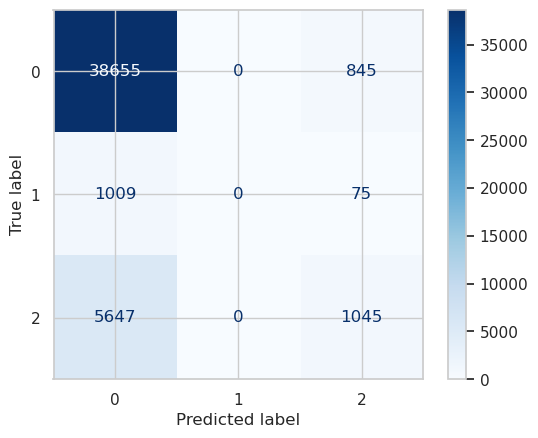

              precision    recall  f1-score      support
0.0            0.853104  0.978608  0.911556  39500.00000
1.0            0.000000  0.000000  0.000000   1084.00000
2.0            0.531807  0.156157  0.241423   6692.00000
accuracy       0.839750  0.839750  0.839750      0.83975
macro avg      0.461637  0.378255  0.384326  47276.00000
weighted avg   0.788063  0.839750  0.795797  47276.00000


In [140]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import warnings
warnings.filterwarnings('ignore')


conf_mat = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix = conf_mat, display_labels = ['0', '1', '2'])
disp.plot(cmap = "Blues")

plt.show()


lr_report = classification_report(y_test, y_pred, output_dict=True)

lr_report_df = pd.DataFrame(lr_report).T
print(lr_report_df)

# KNN PCA95

In [141]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline


classifier = KNeighborsClassifier()

param_grid = {
    'clf__n_neighbors' : np.arange(1, 25),
    'clf__weights' : ('uniform', 'distance'),
    'clf__metric' : ('minkowski', 'chebyshev')
}


# Define the pipeline with SMOTE and your classifier
pipeline = Pipeline([
    ('smote', SMOTE()),  # Apply SMOTE
    ('clf', classifier)  # Classifier
])

cv = StratifiedKFold(n_splits=10)

# Perform grid search with your custom pipeline and cross-validation
grid_search = GridSearchCV(pipeline, param_grid, cv=cv, scoring='accuracy')

# Fit the grid search to your data
#grid_search.fit(x_train, y_train)  # X_train and y_train are your training data

# Fit the grid search to your data
try:
    grid_search.fit(x_train, y_train)  # X_train and y_train are your training data
except ValueError as e:
    print("Error during grid search:", e)


# Print the best hyperparameters found
print("Best parameters:", grid_search.best_params_)

# Print the best mean cross-validation score
print("Best cross-validation accuracy:", grid_search.best_score_)

Best parameters: {'clf__metric': 'minkowski', 'clf__n_neighbors': 2, 'clf__weights': 'uniform'}
Best cross-validation accuracy: 0.7399657327746455


In [142]:
knn = KNeighborsClassifier(n_neighbors = 2, weights = 'uniform', metric = 'minkowski')

knn.fit(x_train, y_train)

y_pred = knn.predict(x_test)
print("Accuracy:", sklearn.metrics.accuracy_score(y_test, y_pred))
print("F1 Score: ", f1_score(y_test, y_pred, average = 'macro'))

Accuracy: 0.8210508503257467
F1 Score:  0.36916160617049726


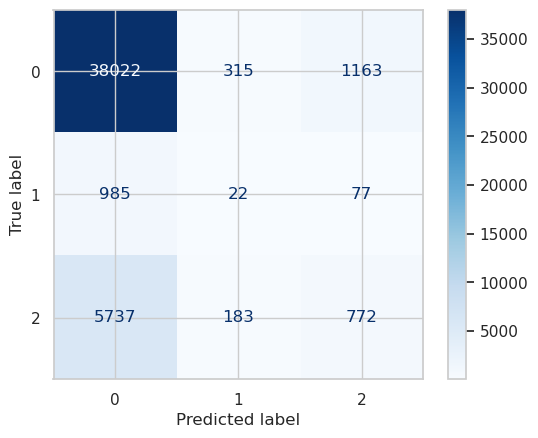

              precision    recall  f1-score       support
0.0            0.849768  0.962582  0.902664  39500.000000
1.0            0.042308  0.020295  0.027431   1084.000000
2.0            0.383698  0.115362  0.177390   6692.000000
accuracy       0.821051  0.821051  0.821051      0.821051
macro avg      0.425258  0.366080  0.369162  47276.000000
weighted avg   0.765280  0.821051  0.779932  47276.000000


In [143]:
conf_mat = confusion_matrix(y_test, y_pred)

knn_report = classification_report(y_test, y_pred, output_dict=True)
disp = ConfusionMatrixDisplay(confusion_matrix = conf_mat, display_labels = ['0', '1', '2'])
disp.plot(cmap = "Blues")

plt.show()

knn_report_df = pd.DataFrame(knn_report).T
print(knn_report_df)

# XGBoost 95

In [144]:
import xgboost as xgb


pipeline = Pipeline([
    ('sampling', SMOTE(random_state=42)),  # Adding SMOTE into the pipeline
    ('xgb', xgb.XGBClassifier(objective='multi:softmax', num_class=3, verbosity=0))
])

# Set the parameters grid for grid search
param_grid = {
    'xgb__max_depth': [3, 4, 5],
    'xgb__learning_rate': [0.1, 0.01, 0.001],
    'xgb__n_estimators': [50, 100, 150],
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=3, scoring='accuracy')

# Fit the model
grid_search.fit(x_train, y_train)

# Get the best parameters and the best accuracy
best_params = grid_search.best_params_
best_accuracy = grid_search.best_score_

print("Best Parameters:", best_params)
print("Best Accuracy:", best_accuracy)

Best Parameters: {'xgb__learning_rate': 0.1, 'xgb__max_depth': 5, 'xgb__n_estimators': 150}
Best Accuracy: 0.6159109898361731


In [146]:
xgb_model = xgb.XGBClassifier(max_depth = 5, 
                          learning_rate = 0.1,
                          n_estimators = 100)

xgb_model.fit(x_train, y_train)

y_pred = xgb_model.predict(x_test)
print("Accuracy:", sklearn.metrics.accuracy_score(y_test, y_pred))
print("F1 Score: ", f1_score(y_test, y_pred, average = 'macro'))

Accuracy: 0.8405533463067941
F1 Score:  0.3717028203089594


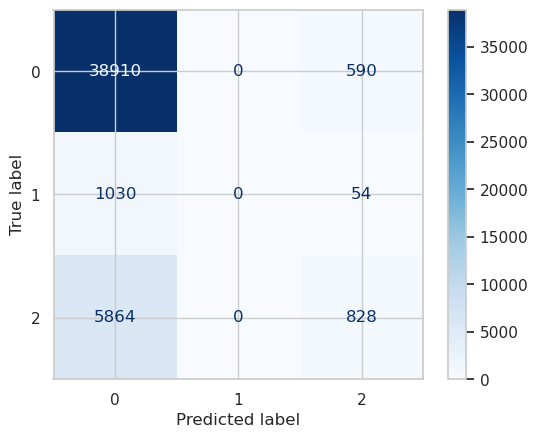

              precision    recall  f1-score       support
0.0            0.849489  0.985063  0.912267  39500.000000
1.0            0.000000  0.000000  0.000000   1084.000000
2.0            0.562500  0.123730  0.202842   6692.000000
accuracy       0.840553  0.840553  0.840553      0.840553
macro avg      0.470663  0.369598  0.371703  47276.000000
weighted avg   0.789387  0.840553  0.790929  47276.000000


In [147]:
conf_mat = confusion_matrix(y_test, y_pred)

xgb_report = classification_report(y_test, y_pred, output_dict=True)
disp = ConfusionMatrixDisplay(confusion_matrix = conf_mat, display_labels = ['0', '1', '2'])
disp.plot(cmap = "Blues")

plt.show()

xgb_report_df = pd.DataFrame(xgb_report).T
print(xgb_report_df)

# ADA PCA95

In [148]:
from sklearn.ensemble import AdaBoostClassifier

classifier = AdaBoostClassifier()

# Define hyperparameters grid for grid search
param_grid = {
    'clf__n_estimators': [50, 100, 150],  # Number of weak learners (decision trees)
    'clf__learning_rate': [0.01, 0.1, 1.0]  # Learning rate (contribution of weak learners)
}



# Define the pipeline with SMOTE and your classifier
pipeline = Pipeline([
    ('smote', SMOTE()),  # Apply SMOTE
    ('clf', classifier)  # Classifier
])

cv = StratifiedKFold(n_splits=10)

# Perform grid search with your custom pipeline and cross-validation
grid_search = GridSearchCV(pipeline, param_grid, cv=cv, scoring='accuracy')

# Fit the grid search to your data
#grid_search.fit(x_train, y_train)  # X_train and y_train are your training data

# Fit the grid search to your data
try:
    grid_search.fit(x_train, y_train)  # X_train and y_train are your training data
except ValueError as e:
    print("Error during grid search:", e)


# Print the best hyperparameters found
print("Best parameters:", grid_search.best_params_)

# Print the best mean cross-validation score
print("Best cross-validation accuracy:", grid_search.best_score_)

Best parameters: {'clf__learning_rate': 1.0, 'clf__n_estimators': 150}
Best cross-validation accuracy: 0.6107127156148309


In [149]:
ab = AdaBoostClassifier(
            n_estimators = 150,
            learning_rate = 1.0
)

ab.fit(x_train, y_train)

y_pred = ab.predict(x_test)

In [150]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import warnings
warnings.filterwarnings('ignore')


conf_mat = confusion_matrix(y_test, y_pred)

ab_report = classification_report(y_test, y_pred, output_dict=True)

ab_report_df = pd.DataFrame(ab_report).T
print(ab_report_df)

              precision    recall  f1-score      support
0.0            0.851712  0.980633  0.911637  39500.00000
1.0            0.000000  0.000000  0.000000   1084.00000
2.0            0.537305  0.144202  0.227380   6692.00000
accuracy       0.839750  0.839750  0.839750      0.83975
macro avg      0.463006  0.374945  0.379672  47276.00000
weighted avg   0.787678  0.839750  0.793876  47276.00000


# PCA 95 Results

In [151]:
import tabulate
from tabulate import tabulate

data = [
    ["Random Forest",rf_report_df.precision[3], rf_report_df.precision[4], rf_report_df.recall[4], rf_report_df['f1-score'][4]],
    ["Logistic Regression", lr_report_df.precision[3], lr_report_df.precision[4], lr_report_df.recall[4], lr_report_df['f1-score'][4]],
    ["KNN",knn_report_df.precision[3], knn_report_df.precision[4], knn_report_df.recall[4], knn_report_df['f1-score'][4]],
    ["XGBoost", xgb_report_df.precision[3], xgb_report_df.precision[4], xgb_report_df.recall[4], xgb_report_df['f1-score'][4]],
    ["Ada Boost", ab_report_df.precision[3], ab_report_df.precision[4], ab_report_df.recall[4],ab_report_df['f1-score'][4]]
]

headers = ["","accuracy", "precision", "recall", "f1-score"]


print(tabulate(data, headers=headers, tablefmt="grid"))

+---------------------+------------+-------------+----------+------------+
|                     |   accuracy |   precision |   recall |   f1-score |
+=====================+============+=============+==========+============+
| Random Forest       |   0.826804 |    0.430408 | 0.383153 |   0.389835 |
+---------------------+------------+-------------+----------+------------+
| Logistic Regression |   0.83975  |    0.461637 | 0.378255 |   0.384326 |
+---------------------+------------+-------------+----------+------------+
| KNN                 |   0.821051 |    0.425258 | 0.36608  |   0.369162 |
+---------------------+------------+-------------+----------+------------+
| XGBoost             |   0.840553 |    0.470663 | 0.369598 |   0.371703 |
+---------------------+------------+-------------+----------+------------+
| Ada Boost           |   0.83975  |    0.463006 | 0.374945 |   0.379672 |
+---------------------+------------+-------------+----------+------------+


# PCA Using Only 3 Attributes

In [152]:
pca=PCA(n_components=3)
x_new=pca.fit_transform(x_std)
x_new

array([[ 2.57819807, -0.42962488,  0.47407923],
       [ 1.94649822,  0.3803991 , -1.71605803],
       [ 0.5714538 ,  0.09911549, -1.00914486],
       ...,
       [-1.70685439,  1.17881109,  0.42581126],
       [-0.08270463, -0.22483322, -1.4837206 ],
       [-1.45145882,  0.60006656,  0.41271354]])

In [153]:
x_train, x_test, y_train, y_test = train_test_split(x_new, y, test_size=0.2, random_state=1)

# Random Forest PCA3

In [154]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
#from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from imblearn.combine import SMOTEENN

# Define your classifier and its parameters
classifier = RandomForestClassifier()

# Define the parameter grid to search
param_grid = {
    'clf__n_estimators': [25, 50, 100],
    'clf__max_depth': [None, 8, 10, 20]
}

# Define the pipeline with SMOTE and your classifier
pipeline = Pipeline([
    ('smote', SMOTE()),  # Apply SMOTE
    ('clf', classifier)  # Classifier
])

# Define a custom cross-validation strategy
cv = StratifiedKFold(n_splits=10)

# Perform grid search with your custom pipeline and cross-validation
grid_search = GridSearchCV(pipeline, param_grid, cv=cv, scoring='accuracy')

# Fit the grid search to your data
#grid_search.fit(x_train, y_train)  # X_train and y_train are your training data

# Fit the grid search to your data
try:
    grid_search.fit(x_train, y_train)  # X_train and y_train are your training data
except ValueError as e:
    print("Error during grid search:", e)

# Print the best hyperparameters found
print("Best parameters:", grid_search.best_params_)

# Print the best mean cross-validation score
print("Best cross-validation accuracy:", grid_search.best_score_)


Best parameters: {'clf__max_depth': None, 'clf__n_estimators': 50}
Best cross-validation accuracy: 0.6803312412695712


In [158]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(
            max_depth = None,
            n_estimators = 50
)

rf.fit(x_train, y_train)

y_pred = rf.predict(x_test)

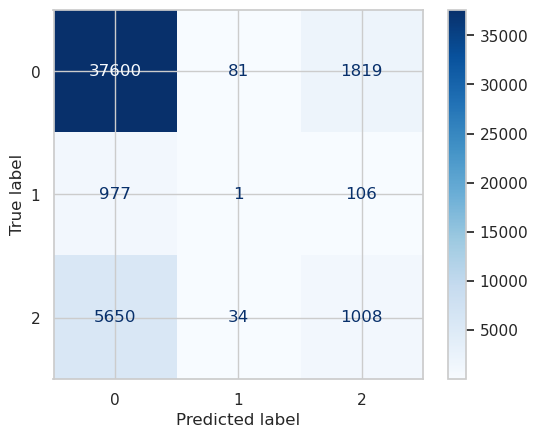

              precision    recall  f1-score       support
0.0            0.850159  0.951899  0.898157  39500.000000
1.0            0.008621  0.000923  0.001667   1084.000000
2.0            0.343675  0.150628  0.209455   6692.000000
accuracy       0.816672  0.816672  0.816672      0.816672
macro avg      0.400819  0.367816  0.369759  47276.000000
weighted avg   0.759170  0.816672  0.780114  47276.000000


In [159]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import warnings
warnings.filterwarnings('ignore')


conf_mat = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix = conf_mat, display_labels = ['0', '1', '2'])
disp.plot(cmap = "Blues")

plt.show()


rf_report = classification_report(y_test, y_pred, output_dict=True)

rf_report_df = pd.DataFrame(rf_report).T
print(rf_report_df)

# Logistic Regression PCA3

In [ ]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier

# Define your classifier and its parameters
classifier = LogisticRegression()

# Define the parameter grid to search
param_grid = {
    'clf__penalty' : ['l1', 'l2'],
    'clf__C' : np.logspace(-3, 3, 7),
    'clf__solver' : ['newton-cg', 'lbfgs', 'liblinear'],
}

# Define the pipeline with SMOTE and your classifier
pipeline = Pipeline([
    ('smote', SMOTE()),  # Apply SMOTE
    ('clf', classifier)  # Classifier
])

# Define a custom cross-validation strategy
cv = StratifiedKFold(n_splits=10)

# Perform grid search with your custom pipeline and cross-validation
grid_search = GridSearchCV(pipeline, param_grid, cv=cv, scoring='accuracy')

# Fit the grid search to your data
#grid_search.fit(x_train, y_train)  # X_train and y_train are your training data

# Fit the grid search to your data
try:
    grid_search.fit(x_train, y_train)  # X_train and y_train are your training data
except ValueError as e:
    print("Error during grid search:", e)

# Print the best hyperparameters found
print("Best parameters:", grid_search.best_params_)

# Print the best mean cross-validation score
print("Best cross-validation accuracy:", grid_search.best_score_)


In [ ]:
logreg = LogisticRegression(C = 1000.0,
                           penalty = 'l2',
                           solver = 'liblinear')
logreg.fit(x_train, y_train)

y_pred = logreg.predict(x_test)

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import warnings
warnings.filterwarnings('ignore')


conf_mat = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix = conf_mat, display_labels = ['0', '1', '2'])
disp.plot(cmap = "Blues")

plt.show()

lr_report = classification_report(y_test, y_pred, output_dict=True)

lr_report_df = pd.DataFrame(lr_report).T
print(lr_report_df)

# KNN PCA3

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline


classifier = KNeighborsClassifier()

param_grid = {
    'clf__n_neighbors' : np.arange(1, 25),
    'clf__weights' : ('uniform', 'distance'),
    'clf__metric' : ('minkowski', 'chebyshev')
}


# Define the pipeline with SMOTE and your classifier
pipeline = Pipeline([
    ('smote', SMOTE()),  # Apply SMOTE
    ('clf', classifier)  # Classifier
])

cv = StratifiedKFold(n_splits=10)

# Perform grid search with your custom pipeline and cross-validation
grid_search = GridSearchCV(pipeline, param_grid, cv=cv, scoring='accuracy')

# Fit the grid search to your data
#grid_search.fit(x_train, y_train)  # X_train and y_train are your training data

# Fit the grid search to your data
try:
    grid_search.fit(x_train, y_train)  # X_train and y_train are your training data
except ValueError as e:
    print("Error during grid search:", e)


# Print the best hyperparameters found
print("Best parameters:", grid_search.best_params_)

# Print the best mean cross-validation score
print("Best cross-validation accuracy:", grid_search.best_score_)

In [ ]:
knn = KNeighborsClassifier(n_neighbors = 2, weights = 'uniform', metric = 'minkowski')

knn.fit(x_train, y_train)

y_pred = knn.predict(x_test)
print("Accuracy:", sklearn.metrics.accuracy_score(y_test, y_pred))
print("F1 Score: ", f1_score(y_test, y_pred, average = 'macro'))

In [ ]:
conf_mat = confusion_matrix(y_test, y_pred)

knn_report = classification_report(y_test, y_pred, output_dict=True)

knn_report_df = pd.DataFrame(knn_report).T
print(knn_report_df)

# XGBoost PCA 3

In [ ]:
import xgboost as xgb


pipeline = Pipeline([
    ('sampling', SMOTE(random_state=42)),  # Adding SMOTE into the pipeline
    ('xgb', xgb.XGBClassifier(objective='multi:softmax', num_class=3, verbosity=0))
])

# Set the parameters grid for grid search
param_grid = {
    'xgb__max_depth': [3, 4, 5],
    'xgb__learning_rate': [0.1, 0.01, 0.001],
    'xgb__n_estimators': [50, 100, 150],
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=3, scoring='accuracy')

# Fit the model
grid_search.fit(x_train, y_train)

# Get the best parameters and the best accuracy
best_params = grid_search.best_params_
best_accuracy = grid_search.best_score_

print("Best Parameters:", best_params)
print("Best Accuracy:", best_accuracy)

In [ ]:
xgb_model = xgb.XGBClassifier(max_depth = 5, 
                          learning_rate = 0.1,
                          n_estimators = 100)

xgb_model.fit(x_train, y_train)

y_pred = xgb_model.predict(x_test)
print("Accuracy:", sklearn.metrics.accuracy_score(y_test, y_pred))
print("F1 Score: ", f1_score(y_test, y_pred, average = 'macro'))

In [ ]:
conf_mat = confusion_matrix(y_test, y_pred)

xgb_report = classification_report(y_test, y_pred, output_dict=True)
disp = ConfusionMatrixDisplay(confusion_matrix = conf_mat, display_labels = ['0', '1', '2'])
disp.plot(cmap = "Blues")

plt.show()

xgb_report_df = pd.DataFrame(xgb_report).T
print(xgb_report_df)

# Ada Boost PCA3

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

classifier = AdaBoostClassifier()

# Define hyperparameters grid for grid search
param_grid = {
    'clf__n_estimators': [50, 100, 150],  # Number of weak learners (decision trees)
    'clf__learning_rate': [0.01, 0.1, 1.0]  # Learning rate (contribution of weak learners)
}



# Define the pipeline with SMOTE and your classifier
pipeline = Pipeline([
    ('smote', SMOTE()),  # Apply SMOTE
    ('clf', classifier)  # Classifier
])

cv = StratifiedKFold(n_splits=10)

# Perform grid search with your custom pipeline and cross-validation
grid_search = GridSearchCV(pipeline, param_grid, cv=cv, scoring='accuracy')

# Fit the grid search to your data
#grid_search.fit(x_train, y_train)  # X_train and y_train are your training data

# Fit the grid search to your data
try:
    grid_search.fit(x_train, y_train)  # X_train and y_train are your training data
except ValueError as e:
    print("Error during grid search:", e)


# Print the best hyperparameters found
print("Best parameters:", grid_search.best_params_)

# Print the best mean cross-validation score
print("Best cross-validation accuracy:", grid_search.best_score_)

In [ ]:
ab = AdaBoostClassifier(
            n_estimators = 150,
            learning_rate = 1.0
)

ab.fit(x_train, y_train)

y_pred = ab.predict(x_test)

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import warnings
warnings.filterwarnings('ignore')


conf_mat = confusion_matrix(y_test, y_pred)

ab_report = classification_report(y_test, y_pred, output_dict=True)

ab_report_df = pd.DataFrame(ab_report).T
print(ab_report_df)

# Results PCA 3

In [ ]:
import tabulate
from tabulate import tabulate

data = [
    ["Random Forest",rf_report_df.precision[3], rf_report_df.precision[4], rf_report_df.recall[4], rf_report_df['f1-score'][4]],
    ["Logistic Regression", lr_report_df.precision[3], lr_report_df.precision[4], lr_report_df.recall[4], lr_report_df['f1-score'][4]],
    ["KNN",knn_report_df.precision[3], knn_report_df.precision[4], knn_report_df.recall[4], knn_report_df['f1-score'][4]],
    ["XGBoost", xgb_report_df.precision[3], xgb_report_df.precision[4], xgb_report_df.recall[4], xgb_report_df['f1-score'][4]],
    ["Ada Boost", ab_report_df.precision[3], ab_report_df.precision[4], ab_report_df.recall[4],ab_report_df['f1-score'][4]]
]

headers = ["","accuracy", "precision", "recall", "f1-score"]


print(tabulate(data, headers=headers, tablefmt="grid"))

# K means

/home/nenad/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/nenad/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/nenad/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/nenad/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/nenad/anaconda3/li

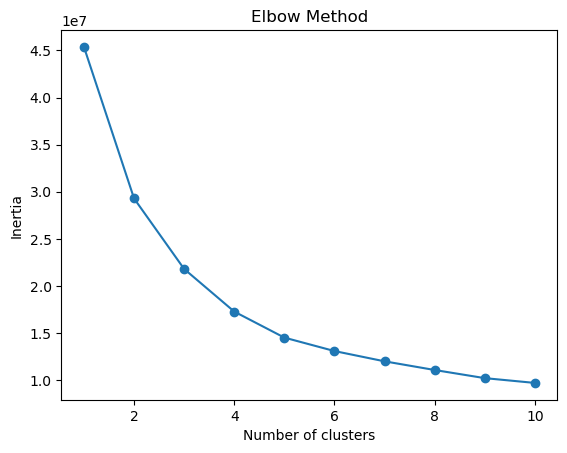

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans



inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

# Plotting the elbow method
plt.plot(range(1, 11), inertia, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method')
plt.show()

In [10]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Choosing the number of clusters (k)
k = 4  # Example: We want to cluster into 3 groups

# Applying K-means algorithm
kmeans = KMeans(n_clusters=k)
kmeans.fit(X_scaled)


#print(X_scaled)
df_test = pd.DataFrame(X_scaled)
# Assigning cluster labels
#cluster_labels = kmeans.labels_

#kmeans.labels_
kmeans.cluster_centers_



# Adding cluster labels to the original DataFrame
#X_with_clusters = X.copy()
#X_with_clusters['Cluster'] = pd.Series(cluster_labels)

# Visualizing the clusters (for 2D data)
# This assumes X has only two features for visualization purposes
# plt.scatter(X_with_clusters['Feature1'], X_with_clusters['Feature2'], c=X_with_clusters['Cluster'], cmap='viridis')
# plt.xlabel('Feature 1')
# plt.ylabel('Feature 2')
# plt.title('K-means Clustering')
# plt.show()

# # Printing centroids of each cluster
# print("Centroids:")
# centroids = scaler.inverse_transform(kmeans.cluster_centers_)
# centroids_df = pd.DataFrame(centroids, columns=X.columns)
# print(centroids_df)

/home/nenad/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


array([[-0.83691948,  1.46193015],
       [-0.96619422, -0.43906093],
       [ 1.21774671, -1.19712077],
       [ 0.58536699,  0.17425154]])

/home/nenad/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


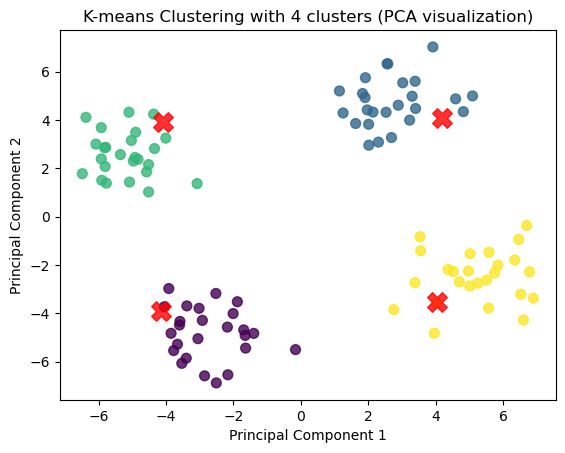

In [28]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Create 4 clusters
kmeans = KMeans(n_clusters=4)
kmeans.fit(X)
y_kmeans = kmeans.predict(X)
centers = kmeans.cluster_centers_

# Visualize the clusters
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_kmeans, cmap='viridis', s=50, alpha=0.8)
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=200, alpha=0.8, marker='X')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('K-means Clustering with 4 clusters (PCA visualization)')
plt.show()

/home/nenad/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


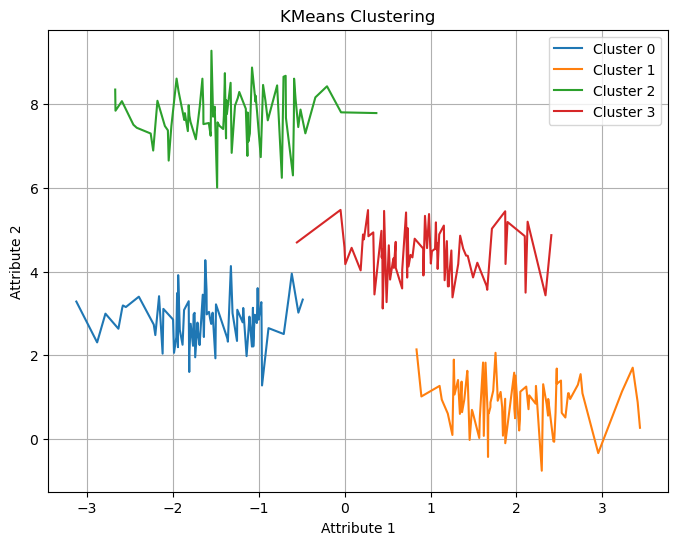

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans

# Step 1: Generate sample data
X, _ = make_blobs(n_samples=300, centers=4, cluster_std=0.60, random_state=0)

# Step 2: Fit KMeans model
kmeans = KMeans(n_clusters=4)
kmeans.fit(X)

# Step 3: Predict cluster labels
labels = kmeans.predict(X)

sorted_indices = np.argsort(X[:, 0])
X_sorted = X[sorted_indices]
labels_sorted = labels[sorted_indices]

# Plotting as line graph
plt.figure(figsize=(8, 6))

for cluster in range(4):
    plt.plot(X_sorted[labels_sorted == cluster, 0], X_sorted[labels_sorted == cluster, 1], label=f'Cluster {cluster}')

plt.title('KMeans Clustering')
plt.xlabel('Attribute 1')
plt.ylabel('Attribute 2')
plt.legend()
plt.grid(True)
plt.show()

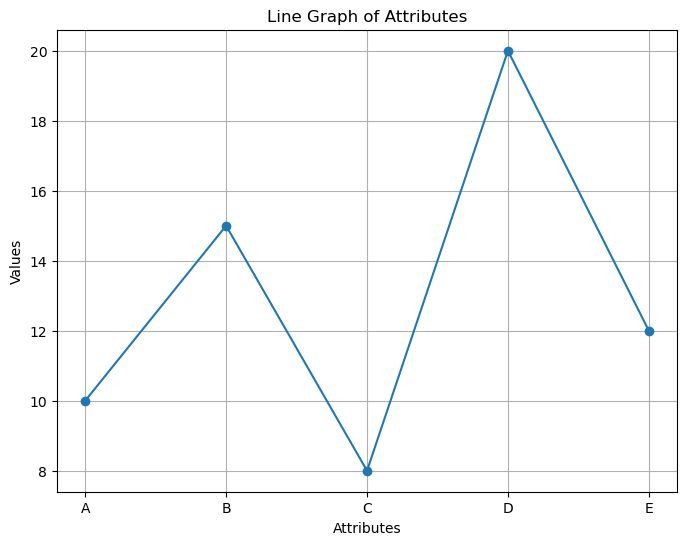

In [7]:
import pandas as pd
import matplotlib.pyplot as plt

# Example DataFrame
data = {
    'Attribute': ['A', 'B', 'C', 'D', 'E'],
    'Value': [10, 15, 8, 20, 12]
}
df = pd.DataFrame(data)

# Plotting the line graph
plt.figure(figsize=(8, 6))
plt.plot(df['Attribute'], df['Value'], marker='o', linestyle='-')
plt.title('Line Graph of Attributes')
plt.xlabel('Attributes')
plt.ylabel('Values')
plt.grid(True)
plt.show()


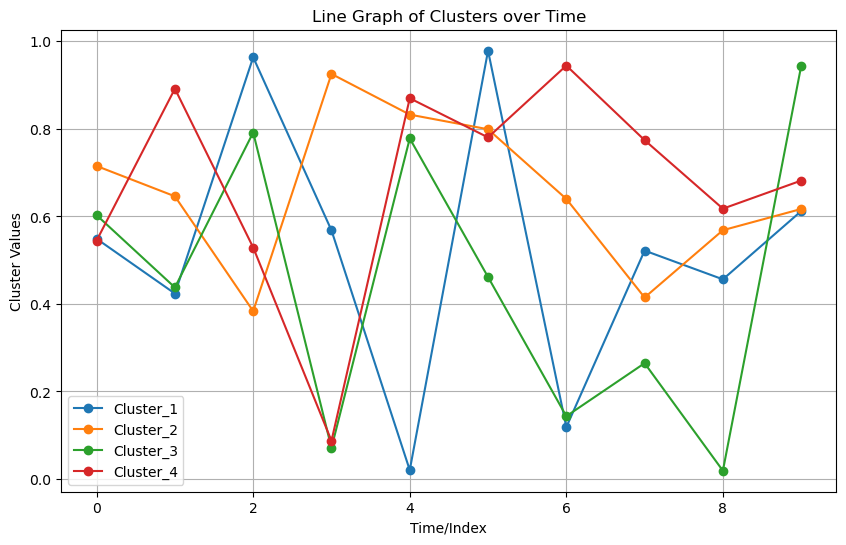

In [8]:

# Example DataFrame with cluster values over time/index
np.random.seed(0)
num_clusters = 4
num_time_steps = 10

data = np.random.rand(num_time_steps, num_clusters)
df = pd.DataFrame(data, columns=[f'Cluster_{i+1}' for i in range(num_clusters)])

# Generating a time/index axis
time_axis = np.arange(num_time_steps)

# Plotting the line graph for each cluster
plt.figure(figsize=(10, 6))
for cluster in df.columns:
    plt.plot(time_axis, df[cluster], marker='o', label=cluster)

plt.title('Line Graph of Clusters over Time')
plt.xlabel('Time/Index')
plt.ylabel('Cluster Values')
plt.legend()
plt.grid(True)
plt.show()

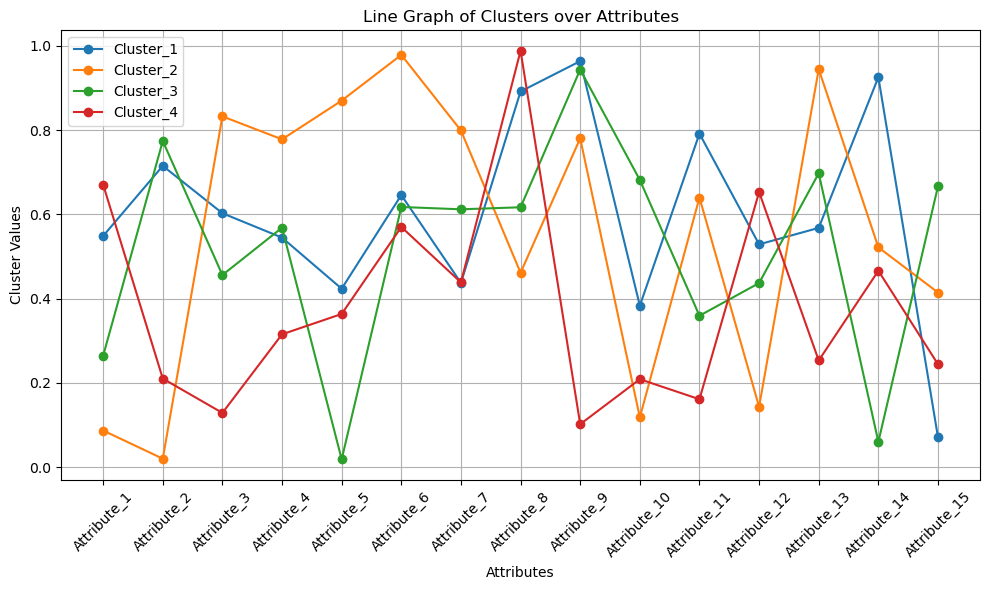

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Example DataFrame with cluster values
num_attributes = 15
num_clusters = 4

# Generating random data for demonstration
np.random.seed(0)
data = np.random.rand(num_clusters, num_attributes)
df = pd.DataFrame(data, columns=[f'Attribute_{i+1}' for i in range(num_attributes)])

# Plotting the line graph for each cluster
plt.figure(figsize=(10, 6))
for cluster in range(num_clusters):
    plt.plot(df.columns, df.iloc[cluster], marker='o', label=f'Cluster_{cluster+1}')

plt.title('Line Graph of Clusters over Attributes')
plt.xlabel('Attributes')
plt.ylabel('Cluster Values')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Example DataFrame with cluster values
num_attributes = 15
num_clusters = 4

# Generating random data for demonstration
np.random.seed(0)
data = np.random.rand(num_clusters, num_attributes)
df = pd.DataFrame(data, columns=[f'Attribute_{i+1}' for i in range(num_attributes)])

# Plotting the line graph for each cluster
plt.figure(figsize=(10, 6))
for cluster in range(num_clusters):
    plt.plot(df.columns, df.iloc[cluster], marker='o', label=f'Cluster_{cluster+1}')

plt.title('Line Graph of Clusters over Attributes')
plt.xlabel('Attributes')
plt.ylabel('Cluster Values')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [13]:
df_test.shape

(300, 2)

In [19]:
X

,HighBP,HighChol,BMI,Stroke,HeartDiseaseorAttack,PhysActivity,HvyAlcoholConsump,GenHlth,MentHlth,PhysHlth,DiffWalk,Age,Income,Education_1.0,Education_2.0,Education_3.0,Education_4.0,Education_5.0,Education_6.0
0,0,1.0,15.0,0.0,0.0,0,0,5.0,10.0,20.0,0.0,11,5.0,0.0,0.0,0.0,1.0,0.0,0.0
1,1,0.0,28.0,0.0,1.0,0,0,2.0,0.0,0.0,0.0,11,3.0,0.0,0.0,0.0,1.0,0.0,0.0
2,1,1.0,33.0,0.0,0.0,1,0,2.0,10.0,0.0,0.0,9,7.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0,1.0,29.0,1.0,1.0,1,0,5.0,0.0,30.0,1.0,12,4.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0,0.0,24.0,0.0,0.0,0,0,3.0,0.0,0.0,1.0,13,6.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236373,1,1.0,21.0,0.0,0.0,1,0,4.0,0.0,0.0,0.0,10,3.0,0.0,1.0,0.0,0.0,0.0,0.0
236374,1,0.0,25.0,0.0,0.0,1,0,2.0,20.0,0.0,0.0,3,5.0,0.0,0.0,0.0,1.0,0.0,0.0
236375,0,1.0,31.0,0.0,0.0,1,0,2.0,0.0,0.0,0.0,7,10.0,0.0,0.0,0.0,0.0,0.0,1.0
236376,1,0.0,24.0,0.0,0.0,1,0,2.0,0.0,0.0,0.0,10,6.0,0.0,0.0,0.0,1.0,0.0,0.0


In [23]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Assuming you have your dataframe loaded into df

# Step 1: Preprocess data if necessary (scaling, handling missing values, etc.)
# You might want to scale your data if the attributes have different scales
# Example:
# from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_scaled = scaler.fit_transform(X)

# Step 2: Perform K-means clustering
k = 4
kmeans = KMeans(n_clusters=k)
kmeans.fit(X)
X['cluster'] = kmeans.labels_

# Step 3: Visualize each cluster on a line graph
# Step 3: Visualize each cluster on a line graph
for cluster_label in range(k):
    cluster_data = X[X['cluster'] == cluster_label].drop(columns=['cluster'])
    plt.figure(figsize=(10, 6))  # Adjust figure size here
    for index, row in cluster_data.iterrows():
        plt.plot(row)
    plt.title(f'Cluster {cluster_label + 1}')
    plt.xlabel('Attributes')
    plt.ylabel('Attribute Values')
    plt.xticks(rotation=45)
    plt.legend(cluster_data.index)
    plt.tight_layout()
    plt.show()


/home/nenad/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/tmp/ipykernel_7628/3129911867.py:32: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/tmp/ipykernel_7628/3129911867.py:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
/home/nenad/anaconda3/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


ValueError: Image size of 846x2974476 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1000x600 with 1 Axes>

/tmp/ipykernel_7628/3129911867.py:32: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/tmp/ipykernel_7628/3129911867.py:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
/home/nenad/anaconda3/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


ValueError: Image size of 846x452451 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1000x600 with 1 Axes>

/tmp/ipykernel_7628/3129911867.py:32: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/tmp/ipykernel_7628/3129911867.py:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
/home/nenad/anaconda3/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


ValueError: Image size of 855x1098336 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1000x600 with 1 Axes>

/tmp/ipykernel_7628/3129911867.py:32: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/tmp/ipykernel_7628/3129911867.py:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
/home/nenad/anaconda3/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


ValueError: Image size of 846x425747 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1000x600 with 1 Axes>

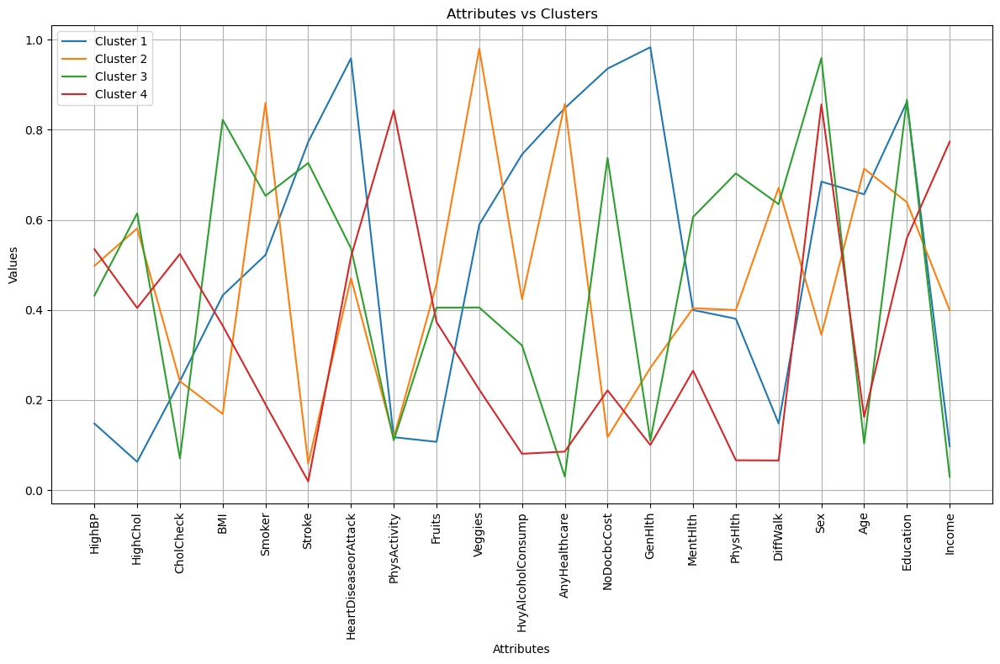

In [27]:
import numpy as np
import matplotlib.pyplot as plt

# Generating random data for each attribute and cluster
attributes = ['HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker',
              'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
              'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
              'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age', 'Education', 'Income']

num_attributes = len(attributes)
num_clusters = 4

# Generate data for each cluster
data = np.random.rand(num_clusters, num_attributes)

# Plotting
plt.figure(figsize=(12, 8))

for i in range(num_clusters):
    plt.plot(attributes, data[i], label=f'Cluster {i+1}')

plt.title('Attributes vs Clusters')
plt.xlabel('Attributes')
plt.ylabel('Values')
plt.xticks(rotation=90)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
